In [1]:
import numpy as np
import matplotlib.pyplot as plt
import keras
import keras.layers as layers
import keras.backend as K
import keras.utils
import tensorflow as tf

import chipwhisperer as cw

from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import Dark2_5 as palette
import itertools

import datetime
import time

import os

import math
import statistics

from tqdm import tqdm
from keras.layers import concatenate

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score


# 세션이 GPU의 모든 메모리를 할당받지 않고 유동적으로 필요한 만큼만 할당받도록 함.
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
K.tensorflow_backend.set_session(tf.Session(config=config))

Using TensorFlow backend.


In [2]:
AES_S_BOX = (
    0x63, 0x7C, 0x77, 0x7B, 0xF2, 0x6B, 0x6F, 0xC5, 0x30, 0x01, 0x67, 0x2B, 0xFE, 0xD7, 0xAB, 0x76,
    0xCA, 0x82, 0xC9, 0x7D, 0xFA, 0x59, 0x47, 0xF0, 0xAD, 0xD4, 0xA2, 0xAF, 0x9C, 0xA4, 0x72, 0xC0,
    0xB7, 0xFD, 0x93, 0x26, 0x36, 0x3F, 0xF7, 0xCC, 0x34, 0xA5, 0xE5, 0xF1, 0x71, 0xD8, 0x31, 0x15,
    0x04, 0xC7, 0x23, 0xC3, 0x18, 0x96, 0x05, 0x9A, 0x07, 0x12, 0x80, 0xE2, 0xEB, 0x27, 0xB2, 0x75,
    0x09, 0x83, 0x2C, 0x1A, 0x1B, 0x6E, 0x5A, 0xA0, 0x52, 0x3B, 0xD6, 0xB3, 0x29, 0xE3, 0x2F, 0x84,
    0x53, 0xD1, 0x00, 0xED, 0x20, 0xFC, 0xB1, 0x5B, 0x6A, 0xCB, 0xBE, 0x39, 0x4A, 0x4C, 0x58, 0xCF,
    0xD0, 0xEF, 0xAA, 0xFB, 0x43, 0x4D, 0x33, 0x85, 0x45, 0xF9, 0x02, 0x7F, 0x50, 0x3C, 0x9F, 0xA8,
    0x51, 0xA3, 0x40, 0x8F, 0x92, 0x9D, 0x38, 0xF5, 0xBC, 0xB6, 0xDA, 0x21, 0x10, 0xFF, 0xF3, 0xD2,
    0xCD, 0x0C, 0x13, 0xEC, 0x5F, 0x97, 0x44, 0x17, 0xC4, 0xA7, 0x7E, 0x3D, 0x64, 0x5D, 0x19, 0x73,
    0x60, 0x81, 0x4F, 0xDC, 0x22, 0x2A, 0x90, 0x88, 0x46, 0xEE, 0xB8, 0x14, 0xDE, 0x5E, 0x0B, 0xDB,
    0xE0, 0x32, 0x3A, 0x0A, 0x49, 0x06, 0x24, 0x5C, 0xC2, 0xD3, 0xAC, 0x62, 0x91, 0x95, 0xE4, 0x79,
    0xE7, 0xC8, 0x37, 0x6D, 0x8D, 0xD5, 0x4E, 0xA9, 0x6C, 0x56, 0xF4, 0xEA, 0x65, 0x7A, 0xAE, 0x08,
    0xBA, 0x78, 0x25, 0x2E, 0x1C, 0xA6, 0xB4, 0xC6, 0xE8, 0xDD, 0x74, 0x1F, 0x4B, 0xBD, 0x8B, 0x8A,
    0x70, 0x3E, 0xB5, 0x66, 0x48, 0x03, 0xF6, 0x0E, 0x61, 0x35, 0x57, 0xB9, 0x86, 0xC1, 0x1D, 0x9E,
    0xE1, 0xF8, 0x98, 0x11, 0x69, 0xD9, 0x8E, 0x94, 0x9B, 0x1E, 0x87, 0xE9, 0xCE, 0x55, 0x28, 0xDF,
    0x8C, 0xA1, 0x89, 0x0D, 0xBF, 0xE6, 0x42, 0x68, 0x41, 0x99, 0x2D, 0x0F, 0xB0, 0x54, 0xBB, 0x16,
)

In [3]:
AES_S_BOX_HW = (
 4,  5,  6,  6,  5,  5,  6,  4,
 2,  1,  5,  4,  7,  6,  5,  5,
 4,  2,  4,  6,  6,  4,  4,  4,
 5,  4,  3,  6,  4,  3,  4,  2,
 6,  7,  4,  3,  4,  6,  7,  4,
 3,  4,  5,  5,  4,  4,  3,  3,
 1,  5,  3,  4,  2,  4,  2,  4,
 3,  2,  1,  4,  6,  4,  4,  5,
 2,  3,  3,  3,  4,  5,  4,  2,
 3,  5,  5,  5,  3,  5,  5,  2,
 4,  4,  0,  6,  1,  6,  4,  5,
 4,  5,  6,  4,  3,  3,  3,  6,
 3,  7,  4,  7,  3,  4,  4,  3,
 3,  6,  1,  7,  2,  4,  6,  3,
 3,  4,  1,  5,  3,  5,  3,  6,
 5,  5,  5,  2,  1,  8,  6,  4,
 5,  2,  3,  5,  6,  5,  2,  4,
 3,  5,  6,  5,  3,  5,  3,  5,
 2,  2,  5,  5,  2,  3,  2,  2,
 3,  6,  4,  2,  6,  5,  3,  6,
 3,  3,  4,  2,  3,  2,  2,  4,
 3,  5,  4,  3,  3,  4,  4,  5,
 6,  3,  5,  5,  4,  5,  4,  4,
 4,  4,  5,  5,  4,  5,  5,  1,
 5,  4,  3,  4,  3,  4,  4,  4,
 4,  6,  4,  5,  4,  6,  4,  3,
 3,  5,  5,  4,  2,  2,  6,  3,
 3,  4,  5,  5,  3,  3,  4,  5,
 4,  5,  3,  2,  4,  5,  4,  3,
 5,  4,  4,  5,  5,  4,  2,  7,
 3,  3,  3,  3,  7,  5,  2,  3,
 2,  4,  4,  4,  3,  3,  6,  3,
)

In [4]:
project_rk = cw.open_project("D:\ML_based_SCA\projects_NonProfile\ZO-AES_Nonprofile")

In [5]:
output_notebook()
p = figure(sizing_mode = 'scale_width', plot_height = 100)

colors = itertools.cycle(palette)

x_range = range(0, len(project_rk.waves[0]))
for i, color in zip(range(10), colors):
    p.line(x_range, project_rk.waves[i], color = color)
    
show(p)

Loading BokehJS ...

In [6]:
pts = np.array(project_rk.textins[:])
keys = np.array(project_rk.keys[:])

# train 90%, validation 10%
num_traces = project_rk.traces.max + 1
num_training = int(num_traces * 0.9)
print('#traces : {}, #training : {}'.format(num_traces, num_training))

# cal Sbox output
inter_data = np.array(AES_S_BOX_HW)[(pts ^ keys).astype(int)]

#traces : 3000, #training : 2700


# Preprocessing function

In [7]:
# [-1, 1]
def MeanNor(data, TraceNum):    
    data_in = data.copy()
    for i in range(TraceNum):
        data_in[i] -= data_in[i].mean()
        MIN = min(data_in[i])
        MAX = max(data_in[i])
        data_in[i] = ((data_in[i] - MIN)/(MAX - MIN) - 0.5) * 2    
    return data_in

In [8]:
# B0 : 1075
poi_sta = 1200
poi_end = 2000

Trace_pre = np.array(project_rk.waves[:])[:, poi_sta:poi_end] 
Trace_pre_normal = MeanNor(Trace_pre, num_traces)

####################################################
output_notebook()
p = figure(sizing_mode='scale_width', plot_height=200)

colors = itertools.cycle(palette)

x_range = range(0, len(Trace_pre[0]))
for i, color in zip(range(10), colors):
    p.line(x_range, Trace_pre[i], color=color)
show(p)

####################################################
output_notebook()
p = figure(sizing_mode='scale_width', plot_height=200)

colors = itertools.cycle(palette)

x_range = range(0, len(Trace_pre_normal[0]))
for i, color in zip(range(10), colors):
    p.line(x_range, Trace_pre_normal[i], color=color)
show(p)

Loading BokehJS ...

Loading BokehJS ...

# MLP

In [9]:
def display_model_structure(model, figsize = (10, 20), saveTo = 'dummy.png'):
    keras.utils.plot_model(model, to_file=saveTo, show_shapes = True, show_layer_names=True)
    fig = plt.figure(figsize = figsize)
    ax = plt.axes()
    ax.axis('off')
    ax.imshow(plt.imread(saveTo))
    plt.show()
    return

In [10]:
def custom_loss_corr(y_true,y_pred):
    x = y_true
    y = y_pred
    mx = K.mean(x)
    my = K.mean(y)
    xm = x - mx
    ym = y - my
    xmym = xm * ym
    r_num = K.sum(xmym)
    r_den = K.sqrt(K.sum(K.square(xm)) * K.sum(K.square(ym)))
    r = r_num / (r_den + K.epsilon())
    r = 1 - r
    loss = K.sum(r)
    return loss

def custom_loss_abscorr(y_true,y_pred):
    x = y_true
    y = y_pred
    mx = K.mean(x)
    my = K.mean(y)
    xm = x - mx
    ym = y - my
    xmym = xm * ym
    r_num = K.sum(xmym)
    r_den = K.sqrt(K.sum(K.square(xm)) * K.sum(K.square(ym)))
    r = r_num / (r_den + K.epsilon())
    r = 1 - K.abs(r)
    loss = K.sum(r)
    return loss

def custom_loss_mse(y_true,y_pred):
    return K.mean(K.square(y_pred - y_true), axis=-1)

In [11]:
def build_MLP(points_len = 10000, hidden_actfunc = ['relu', 'relu', 'relu'], hidden_nodes = [300, 300, 300], batch_layers = ['T', 'T', 'T'], batch_layers2 = ['T', 'T', 'T'], dropout_layers = [0.2, 0.2, 0.2], out_actfunc = 'softmax', kernel_initializer = "normal", optimizer = keras.optimizers.Adam(0.001, 0.5), loss = 'categorical_crossentropy', num_classes = 9, folder = './MLSCA', result_type = 'HW'):
    model = keras.models.Sequential()
    
    # dense layer
    model.add(keras.layers.Dense(hidden_nodes[0], input_dim = points_len, name = 'dense_1', kernel_initializer = kernel_initializer))
    if batch_layers[0] == 'T':
        # batch normalization layer
        model.add(keras.layers.BatchNormalization(name = 'batch_1'))
        
    ####################################################
    # activation fuction
    if hidden_actfunc[0] == 'leakyrelu':
        model.add(keras.layers.LeakyReLU(name = 'leakyrelu_1'))
    elif hidden_actfunc[0] == 'relu':
        model.add(keras.layers.ReLU(name = 'relu_1'))
    elif hidden_actfunc[0] == 'prelu':
        model.add(keras.layers.PReLU(name = 'prelu_1'))
    elif hidden_actfunc[0] == 'elu':
        model.add(keras.layers.ELU(name = 'elu_1'))
    elif hidden_actfunc[0] == 'thresholdrelu':
        model.add(keras.layers.ThresholdedReLU(name = 'thelu_1'))
    elif hidden_actfunc[0] == 'tanh':
        model.add(keras.layers.Activation('tanh', name = 'tanh_1'))
    ####################################################
    
    if batch_layers2[0] == 'T':
        # batch normalization layer
        model.add(keras.layers.BatchNormalization(name = 'batch2_1'))
        
    if dropout_layers[0] != 0:
        # dropout layer
        model.add(keras.layers.Dropout(dropout_layers[0], name = 'dropout_1'))
        
    # 2~
    for i, num_units in enumerate(hidden_nodes[1:]):
        # dense layer
        model.add(keras.layers.Dense(num_units, name = 'dense_{}'.format(i + 2), kernel_initializer = kernel_initializer))
        if batch_layers[i + 1] == 'T':
            # batch normalization layer
            model.add(keras.layers.BatchNormalization(name = 'batch_{}'.format(i + 2)))
            
        ####################################################
        # activation fuction
        if hidden_actfunc[i + 1] == 'leakyrelu':
            model.add(keras.layers.LeakyReLU(alpha = 0.2, name = 'leakyrelu_{}'.format(i + 2)))
            #model.add(keras.layers.LeakyReLU(name = 'leakyrelu_{}'.format(i + 2)))
        elif hidden_actfunc[i + 1] == 'relu':
            model.add(keras.layers.ReLU(name = 'relu_{}'.format(i + 2)))
        elif hidden_actfunc[i + 1] == 'prelu':
            model.add(keras.layers.PReLU(name = 'prelu_{}'.format(i + 2)))
        elif hidden_actfunc[i + 1] == 'elu':
            model.add(keras.layers.ELU(name = 'elu_{}'.format(i + 2)))
        elif hidden_actfunc[i + 1] == 'thresholdrelu':
            model.add(keras.layers.ThresholdedReLU(name = 'thelu_{}'.format(i + 2)))
        elif hidden_actfunc[i + 1] == 'tanh':
            model.add(keras.layers.Activation('tanh', name = 'tanh_{}'.format(i + 2)))
        ####################################################
        
        if batch_layers2[i + 1] == 'T':
            # batch normalization layer
            model.add(keras.layers.BatchNormalization(name = 'batch2_{}'.format(i + 2)))
            
        if dropout_layers[i + 1] != 0:
            #dropout layer
            model.add(keras.layers.Dropout(dropout_layers[i + 1], name = 'dropout_{}'.format(i + 2)))
    
    # out dense layer
    model.add(keras.layers.Dense(num_classes, activation = out_actfunc, name = 'dense_{}'.format(len(hidden_nodes) + 1), kernel_initializer = kernel_initializer))
    
    model.summary(80)
    
    # input layer
    inp = keras.layers.Input(shape = (points_len, ), name = 'input')
    z = layers.normalization.BatchNormalization()(inp)    
    sequence = model(z)
    
    m = keras.models.Model(inp, sequence, name = 'MLSCA')
    
    ####################################################
    # loss function
    if loss == 'custom_mse':
        m.compile(optimizer = optimizer, loss = custom_loss_mse, metrics=['accuracy'])
    elif loss == 'custom_corr':
        m.compile(optimizer = optimizer, loss = custom_loss_corr, metrics=['accuracy'])
    elif loss == 'custom_abscorr':
        m.compile(optimizer = optimizer, loss = custom_loss_abscorr, metrics=['accuracy'])
    else : 
        m.compile(optimizer = optimizer, loss = loss, metrics = ['accuracy'])
    ####################################################
    
    display_model_structure(m, saveTo = '{}/Global-pre_MLP_profile_{}.png'.format(folder, result_type))
    display_model_structure(model, saveTo = '{}/Global-pre_MLP_profile_{}_model.png'.format(folder, result_type))
    
    return m

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [1]:
def analysis_val_accuracy(model, Init, traces, pts, tr_num, target_byte, num_keycandi, result_type, batch_size, epochs, right_key, file_index, rate):
    
    ####################################################
    a = []
    accuracies = []
    best_acc = 0   
    train_num = int(tr_num * rate)
    ####################################################
    
    for k in tqdm(range(0, num_keycandi)):
        m.set_weights(Init)
        
        hypothesis = np.array(AES_S_BOX)[(pts[:, target_byte] ^ k).astype(int)]
        
        if result_type == 'Value':
            target = keras.utils.to_categorical(hypothesis, 256)
        elif result_type == 'HW':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            target = keras.utils.to_categorical(target, 9)
        elif result_type == 'HW_Value':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            target = target / 8 # sigmoid
        elif result_type == 'MSB':
            target = (hypothesis >> 7) & 1
            target = keras.utils.to_categorical(target, 2)
        elif result_type == 'MSB_Value':
            target = (hypothesis >> 7) & 1
        elif result_type == 'LSB':
            target = hypothesis & 1
            target = keras.utils.to_categorical(target, 2)
        elif result_type == 'LSB_Value':
            target = hypothesis & 1
        elif result_type == 'DPA':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            target = target > 4
            target = keras.utils.to_categorical(target, 2)
        elif result_type == 'DPA_Value':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            for i in range(tr_num):
                target[i] = int(target[i] > 4)
            
        m.fit(x = traces[:train_num], y = target[:train_num], validation_data = [traces[train_num:tr_num], target[train_num:tr_num]], initial_epoch = 0, epochs = epochs, batch_size = batch_size, verbose = 0)
        
        a.append(m.history.history['accuracy'])
        accuracies.append(m.history.history['val_accuracy'])
        if k == 0:
            best_acc = m.history.history['val_accuracy'][epochs - 1]    
            right_candi = k
        if best_acc < m.history.history['val_accuracy'][epochs - 1]:
            best_acc = m.history.history['val_accuracy'][epochs - 1]
            filename = '%s/Global_pre_MLP_nonprofile_%s.h5' % (folder, file_index)
            m.save_weights(filename)
            right_candi = k
            
    print("Right key : ", hex(right_key))
    print("Right candidate : ", hex(right_candi))
    
    plt.figure(figsize = (16, 6))
    if(right_candi == right_key):
        for k in range(0, right_candi - 1):
            plt.plot(accuracies[k], color = 'black', label = None)
        for k in range(right_candi + 1, num_keycandi - 1):
            plt.plot(accuracies[k], color = 'black', label = None)
    elif (right_candi > right_key):
        for k in range(0, right_key - 1):
            plt.plot(accuracies[k], color = 'black', label = None)
        for k in range(right_key + 1, right_candi - 1):
            plt.plot(accuracies[k], color = 'black', label = None)
        for k in range(right_candi + 1, num_keycandi - 1):
            plt.plot(accuracies[k], color = 'black', label = None)  
        plt.plot(accuracies[right_candi], color = 'blue', label = 'right candi')
    else:
        for k in range(0, right_candi - 1):
            plt.plot(accuracies[k], color = 'black', label = None)
        for k in range(right_candi + 1, right_key - 1):
             plt.plot(accuracies[k], color = 'black', label = None)
        for k in range(right_key + 1, num_keycandi - 1):
             plt.plot(accuracies[k], color = 'black', label = None)
        plt.plot(accuracies[right_candi], color = 'blue', label = 'right candi')
               
    plt.plot(accuracies[int((right_key + right_candi) / 2)], color = 'black', label = 'wrong key')    
    plt.plot(accuracies[right_key], color = 'red', label = 'right key')
    plt.xlabel('#epochs')
    plt.ylabel('val_accuracy')
    plt.title('%s' % file_index)
    
    plt.legend()
    
    filename = '%s/Global_pre_MLP_nonprofile_%s.png' % (folder, file_index)
    plt.savefig(filename)
    plt.show()
    
    return right_candi, accuracies, a    

In [2]:
def analysis_val_loss(model, Init, traces, pts, tr_num, target_byte, num_keycandi, result_type, batch_size, epochs, right_key, file_index, rate):
    
    ####################################################
    l = []
    losses = []
    best_loss = 0   
    train_num = int(tr_num * rate)
    ####################################################
    
    for k in tqdm(range(0, num_keycandi)):
        m.set_weights(Init)
        
        hypothesis = np.array(AES_S_BOX)[(pts[:, target_byte] ^ k).astype(int)]
        
        if result_type == 'Value':
            target = keras.utils.to_categorical(hypothesis, 256)
        elif result_type == 'HW':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            target = keras.utils.to_categorical(target, 9)
        elif result_type == 'HW_Value':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            target = target / 8 # sigmoid
        elif result_type == 'MSB':
            target = (hypothesis >> 7) & 1
            target = keras.utils.to_categorical(target, 2)
        elif result_type == 'MSB_Value':
            target = (hypothesis >> 7) & 1
        elif result_type == 'LSB':
            target = hypothesis & 1
            target = keras.utils.to_categorical(target, 2)
        elif result_type == 'LSB_Value':
            target = hypothesis & 1
        elif result_type == 'DPA':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            target = target > 4
            target = keras.utils.to_categorical(target, 2)
        elif result_type == 'DPA_Value':
            target = sum([hypothesis & (1 << i) > 0 for i in range(8)])
            for i in range(tr_num):
                target[i] = int(target[i] > 4)
            
        m.fit(x = traces[:train_num], y = target[:train_num], validation_data = [traces[train_num:tr_num], target[train_num:tr_num]], initial_epoch = 0, epochs = epochs, batch_size = batch_size, verbose = 0)
        
        l.append(m.history.history['loss'])
        losses.append(m.history.history['val_loss'])
        if k == 0:
            best_loss = m.history.history['val_loss'][epochs - 1]
            right_candi = k
        if best_loss > m.history.history['val_loss'][epochs - 1]:
            best_loss = m.history.history['val_loss'][epochs - 1]
            filename = '%s/Global_pre_MLP_nonprofile_%s.h5' % (folder, file_index)
            m.save_weights(filename)
            right_candi = k
            
    ####################################################
    print("Right key : ", hex(right_key))
    print("Right candidate : ", hex(right_candi))
    
    plt.figure(figsize = (16, 6))
    if(right_candi == right_key):
        for k in range(0, right_candi - 1):
            plt.plot(losses[k], color = 'black', label = None)
        for k in range(right_candi + 1, num_keycandi - 1):
            plt.plot(losses[k], color = 'black', label = None)
    elif (right_candi > right_key):
        for k in range(0, right_key - 1):
            plt.plot(losses[k], color = 'black', label = None)
        for k in range(right_key + 1, right_candi - 1):
            plt.plot(losses[k], color = 'black', label = None)
        for k in range(right_candi + 1, num_keycandi - 1):
            plt.plot(losses[k], color = 'black', label = None)  
        plt.plot(losses[right_candi], color = 'blue', label = 'right candi')
    else:
        for k in range(0, right_candi - 1):
            plt.plot(losses[k], color = 'black', label = None)
        for k in range(right_candi + 1, right_key - 1):
             plt.plot(losses[k], color = 'black', label = None)
        for k in range(right_key + 1, num_keycandi - 1):
             plt.plot(losses[k], color = 'black', label = None)
        plt.plot(losses[right_candi], color = 'blue', label = 'right candi')
               
    plt.plot(losses[int((right_key + right_candi) / 2)], color = 'black', label = 'wrong key')    
    plt.plot(losses[right_key], color = 'red', label = 'right key')
    plt.xlabel('#epochs')
    plt.ylabel('val_loss')
    plt.title('%s' % file_index)
    
    plt.legend()
    
    filename = '%s/Global_pre_MLP_nonprofile_val_loss_%s.png' % (folder, file_index)
    plt.savefig(filename)
    plt.show()
    
    ####################################################
    plt.figure(figsize = (16, 6))
    if(right_candi == right_key):
        for k in range(0, right_candi - 1):
            plt.plot(l[k], color = 'black', label = None)
        for k in range(right_candi + 1, num_keycandi - 1):
            plt.plot(l[k], color = 'black', label = None)
    elif (right_candi > right_key):
        for k in range(0, right_key - 1):
            plt.plot(l[k], color = 'black', label = None)
        for k in range(right_key + 1, right_candi - 1):
            plt.plot(l[k], color = 'black', label = None)
        for k in range(right_candi + 1, num_keycandi - 1):
            plt.plot(l[k], color = 'black', label = None)  
        plt.plot(l[right_candi], color = 'blue', label = 'right candi')
    else:
        for k in range(0, right_candi - 1):
            plt.plot(l[k], color = 'black', label = None)
        for k in range(right_candi + 1, right_key - 1):
             plt.plot(l[k], color = 'black', label = None)
        for k in range(right_key + 1, num_keycandi - 1):
             plt.plot(l[k], color = 'black', label = None)
        plt.plot(l[right_candi], color = 'blue', label = 'right candi')
               
    plt.plot(l[int((right_key + right_candi) / 2)], color = 'black', label = 'wrong key')    
    plt.plot(l[right_key], color = 'red', label = 'right key')
    plt.xlabel('#epochs')
    plt.ylabel('loss')
    plt.title('%s' % file_index)
    
    plt.legend()
    
    filename = '%s/Global_pre_MLP_nonprofile_loss_%s.png' % (folder, file_index)
    plt.savefig(filename)
    plt.show()
    
    return right_candi, losses, l    

# Nonprofiling

target byte: 1
Model: "sequential_6"
________________________________________________________________________________
Layer (type)                        Output Shape                    Param #     
dense_1 (Dense)                     (None, 32)                      25632       
________________________________________________________________________________
batch_1 (BatchNormalization)        (None, 32)                      128         
________________________________________________________________________________
dense_2 (Dense)                     (None, 2)                       66          
Total params: 25,826
Trainable params: 25,762
Non-trainable params: 64
________________________________________________________________________________


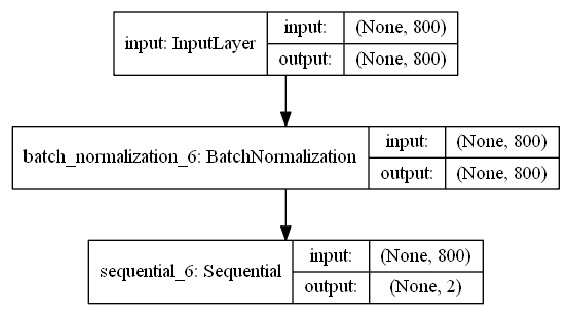

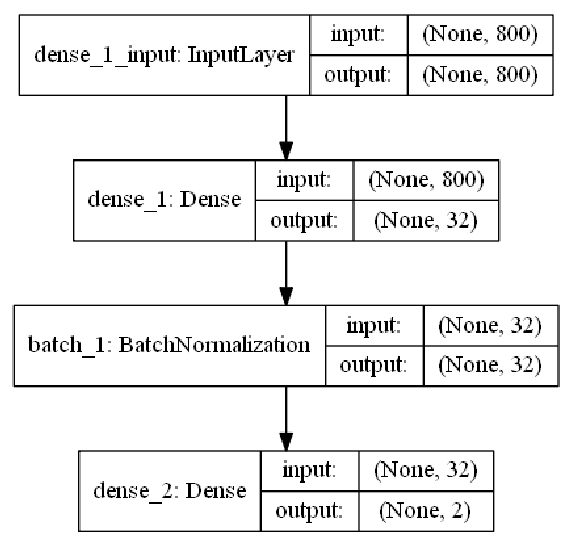

  0%|                                                            | 0/256 [00:00<?, ?it/s]

** right key : 0x2b / #trace : 305 / target byte : 1
Training started:  2020-06-21 23:30:46.173650


100%|██████████████████████████████████████████████████| 256/256 [14:44<00:00,  3.46s/it]


Right key :  0x2b
Right candidate :  0x2b


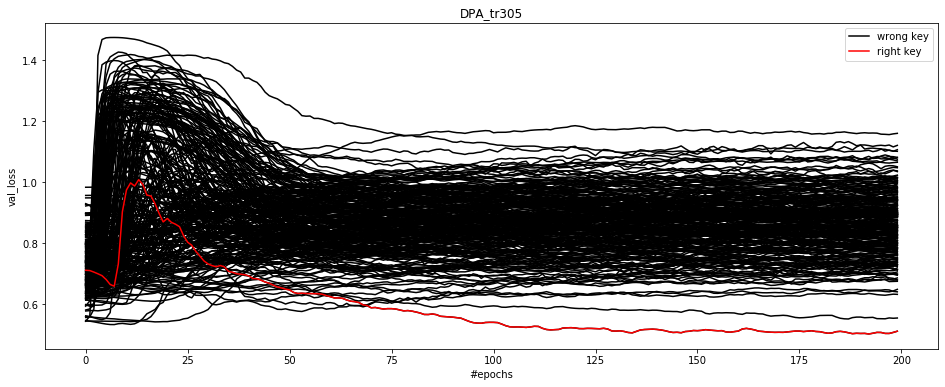

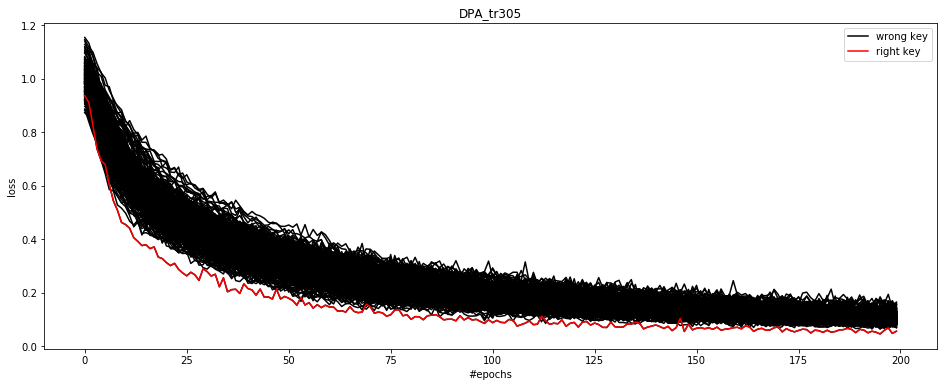

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-21 23:45:33.092467
Elapsed :  886.9178166389465
right key : 0x2b, val_loss : 0.511380646539771, loss : 0.05576244077072457
right candidate : 0x2b
 val_loss : 0.511380646539771
 ratio : 1.0845149424235612 / 1.2389233044142378
 gap : 0.04321930589883227 / 0.013322946611144727


** right key : 0x2b / #trace : 310 / target byte : 1
Training started:  2020-06-21 23:45:33.222422


100%|██████████████████████████████████████████████████| 256/256 [15:30<00:00,  3.64s/it]


Right key :  0x2b
Right candidate :  0x2b


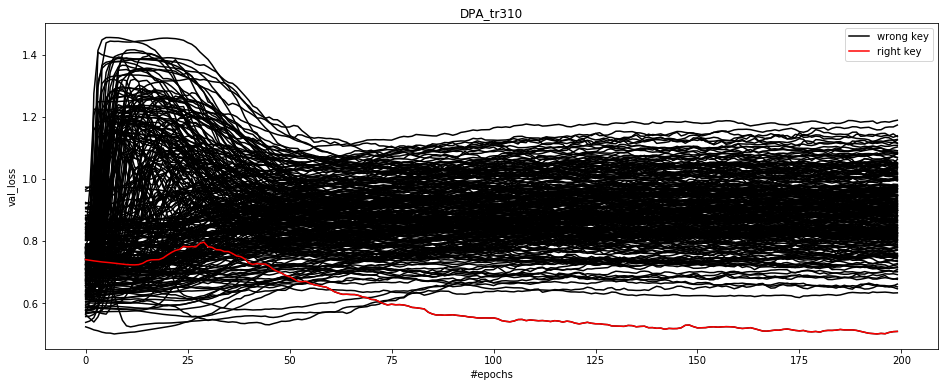

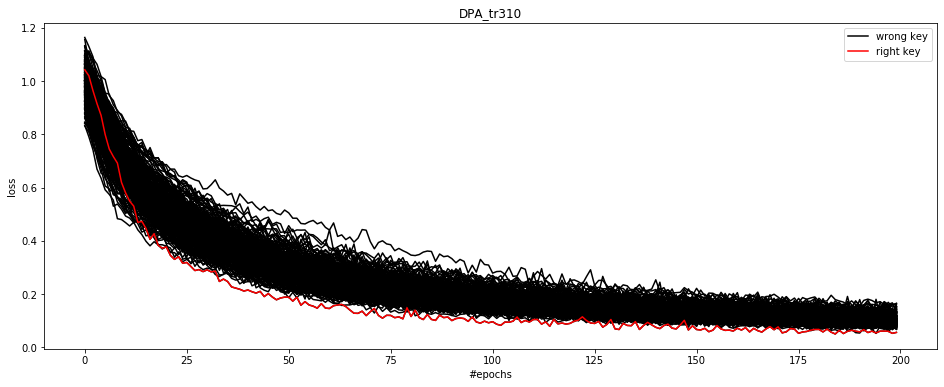

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 00:01:05.893157
Elapsed :  932.6707353591919
right key : 0x2b, val_loss : 0.5083618961995647, loss : 0.05598057854560114
right candidate : 0x2b
 val_loss : 0.5083618961995647
 ratio : 1.2445424481799907 / 1.2032791427404437
 gap : 0.12431606265806383 / 0.011379684016863872


** right key : 0x2b / #trace : 315 / target byte : 1
Training started:  2020-06-22 00:01:06.018515


100%|██████████████████████████████████████████████████| 256/256 [15:21<00:00,  3.60s/it]


Right key :  0x2b
Right candidate :  0x2b


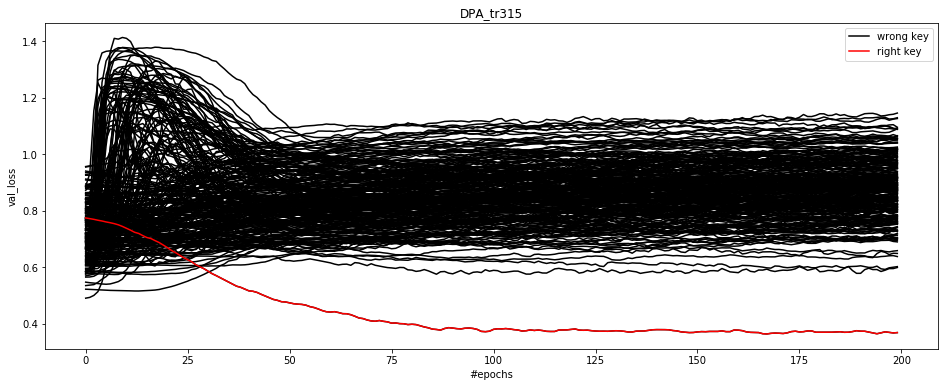

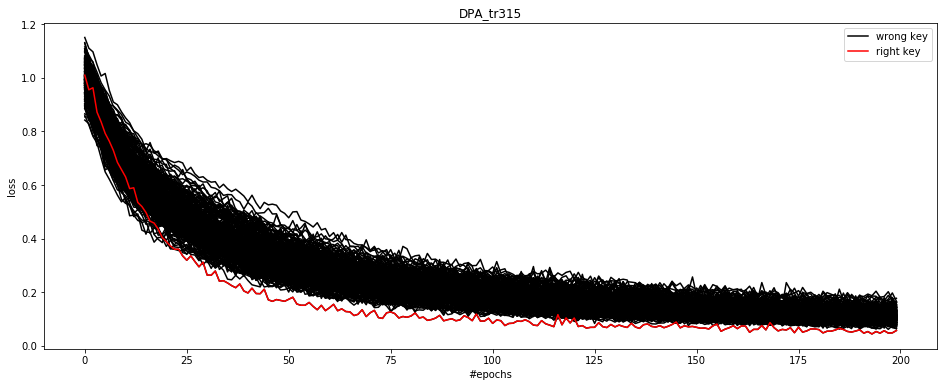

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 00:16:29.545338
Elapsed :  923.5268235206604
right key : 0x2b, val_loss : 0.3685005749526777, loss : 0.05743912241675637
right candidate : 0x2b
 val_loss : 0.3685005749526777
 ratio : 1.6250662934100772 / 1.1068974091450643
 gap : 0.23033728850515262 / 0.006140093369917436


** right key : 0x2b / #trace : 320 / target byte : 1
Training started:  2020-06-22 00:16:29.664033


100%|██████████████████████████████████████████████████| 256/256 [16:06<00:00,  3.78s/it]


Right key :  0x2b
Right candidate :  0x2b


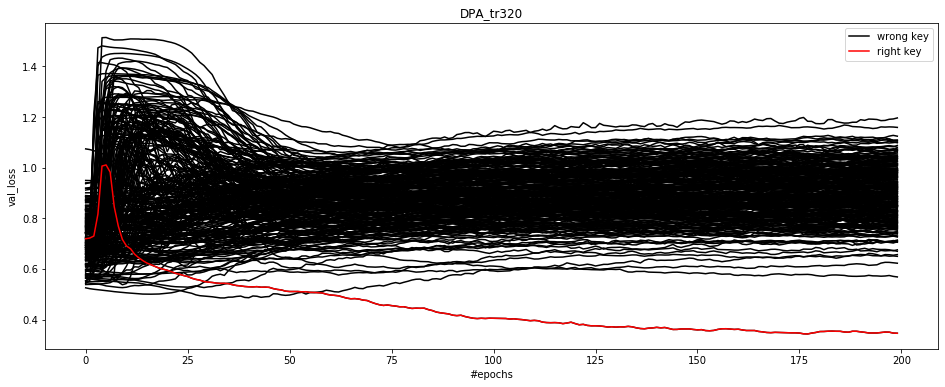

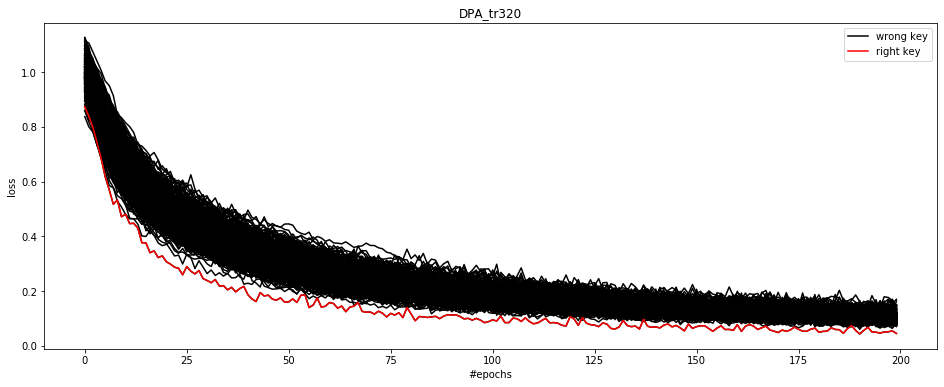

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 00:32:38.435297
Elapsed :  968.7712645530701
right key : 0x2b, val_loss : 0.3457619349161784, loss : 0.0449680004801069
right candidate : 0x2b
 val_loss : 0.3457619349161784
 ratio : 1.6436551357806988 / 1.568036182095846
 gap : 0.22255144516626996 / 0.025543451309204095


** right key : 0x2b / #trace : 325 / target byte : 1
Training started:  2020-06-22 00:32:38.567165


100%|██████████████████████████████████████████████████| 256/256 [17:03<00:00,  4.00s/it]


Right key :  0x2b
Right candidate :  0x2b


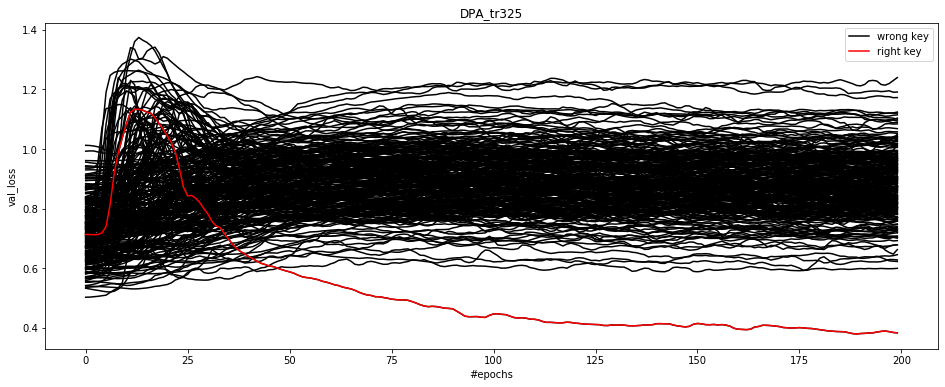

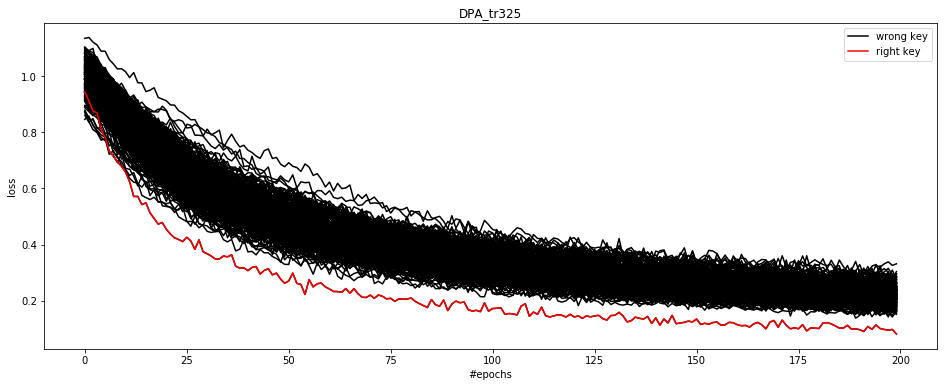

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 00:49:44.061541
Elapsed :  1025.4943761825562
right key : 0x2b, val_loss : 0.3831193568755169, loss : 0.08109443802140358
right candidate : 0x2b
 val_loss : 0.3831193568755169
 ratio : 1.5653869373441065 / 1.8656550063404358
 gap : 0.21661067982109228 / 0.0701998062595922


** right key : 0x2b / #trace : 330 / target byte : 1
Training started:  2020-06-22 00:49:44.184371


100%|██████████████████████████████████████████████████| 256/256 [17:20<00:00,  4.07s/it]


Right key :  0x2b
Right candidate :  0x2b


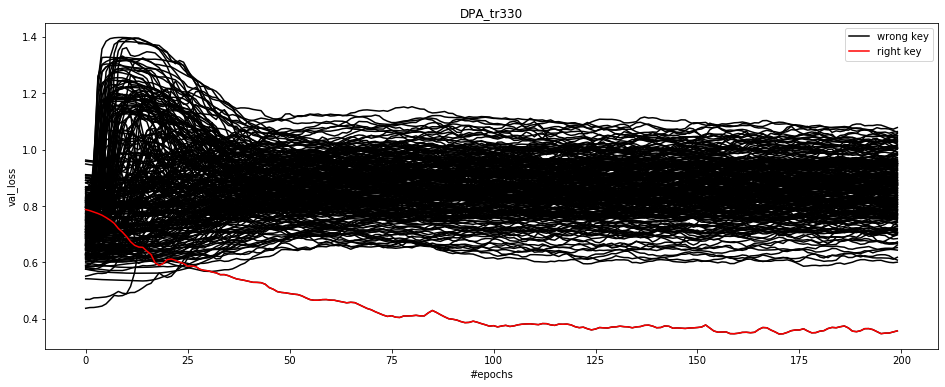

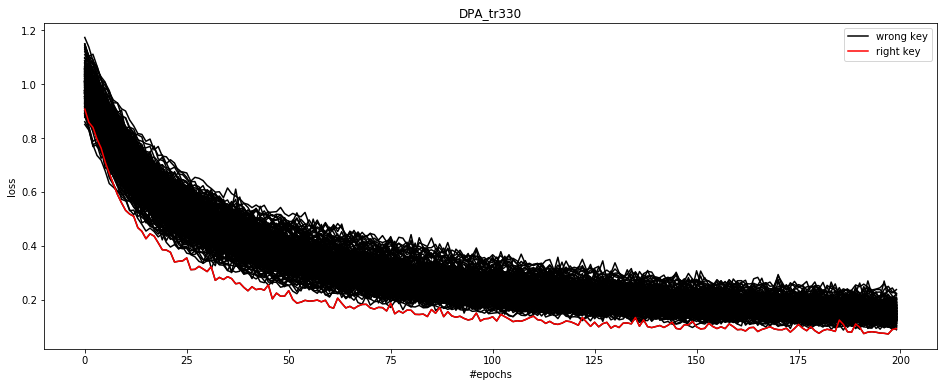

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 01:07:07.016633
Elapsed :  1042.8322620391846
right key : 0x2b, val_loss : 0.3573428726196289, loss : 0.09278512519338857
right candidate : 0x2b
 val_loss : 0.3573428726196289
 ratio : 1.6817727158891103 / 0.9545790626907108
 gap : 0.24362662076950076 / -0.0042143873546434535


** right key : 0x2b / #trace : 335 / target byte : 1
Training started:  2020-06-22 01:07:07.135705


100%|██████████████████████████████████████████████████| 256/256 [17:22<00:00,  4.07s/it]


Right key :  0x2b
Right candidate :  0x2b


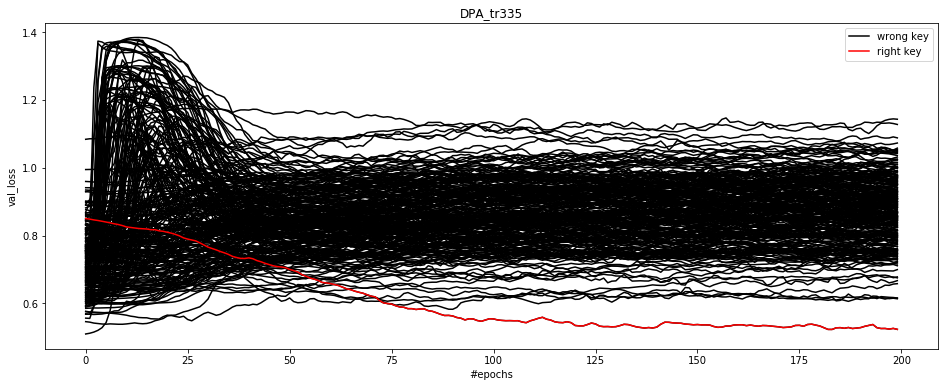

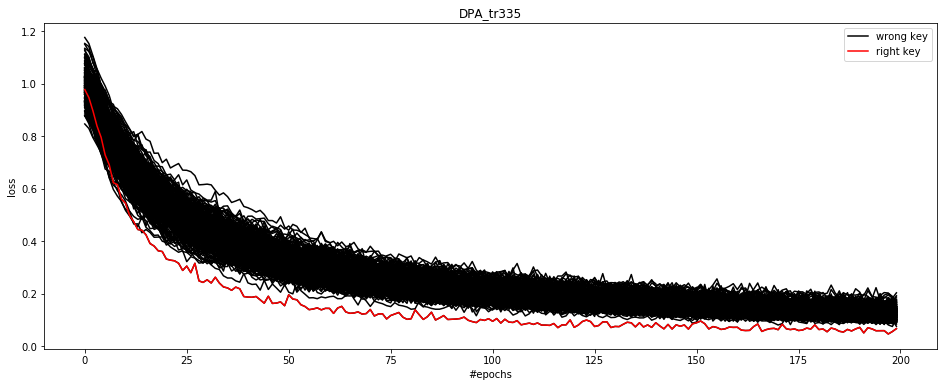

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 01:24:32.429553
Elapsed :  1045.2938482761383
right key : 0x2b, val_loss : 0.5236757568793722, loss : 0.06756643250457242
right candidate : 0x2b
 val_loss : 0.5236757568793722
 ratio : 1.1722149487143412 / 1.128492023725887
 gap : 0.09018479361392484 / 0.00868174764845106


** right key : 0x2b / #trace : 340 / target byte : 1
Training started:  2020-06-22 01:24:32.556737


100%|██████████████████████████████████████████████████| 256/256 [17:15<00:00,  4.05s/it]


Right key :  0x2b
Right candidate :  0xe0


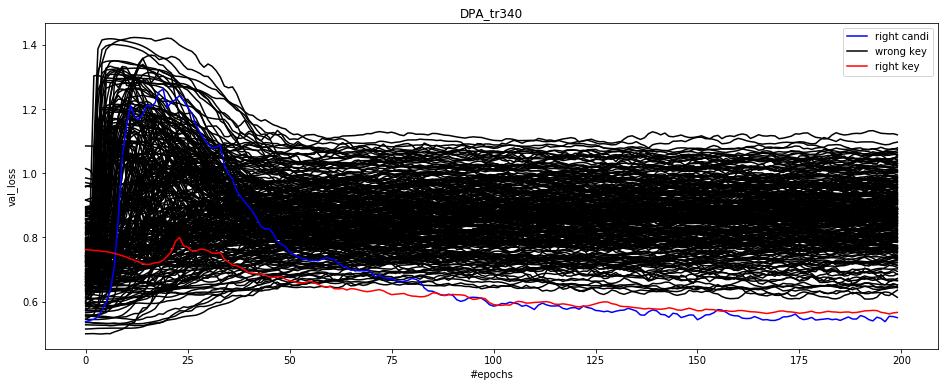

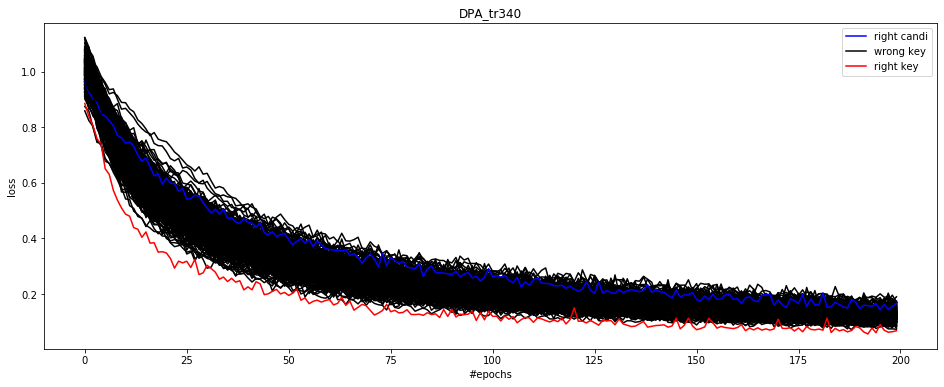

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 01:41:50.656426
Elapsed :  1038.099689245224
right key : 0x2b, val_loss : 0.5664870186338147, loss : 0.0677745981055473
right candidate : 0xe0
 val_loss : 0.5501879122361396
 ratio : 0.9712277495131605 / 2.4579683453688044
 gap : -0.016299106397675067 / 0.0988132186579805


** right key : 0x2b / #trace : 345 / target byte : 1
Training started:  2020-06-22 01:41:50.770457


100%|██████████████████████████████████████████████████| 256/256 [17:32<00:00,  4.11s/it]


Right key :  0x2b
Right candidate :  0x2b


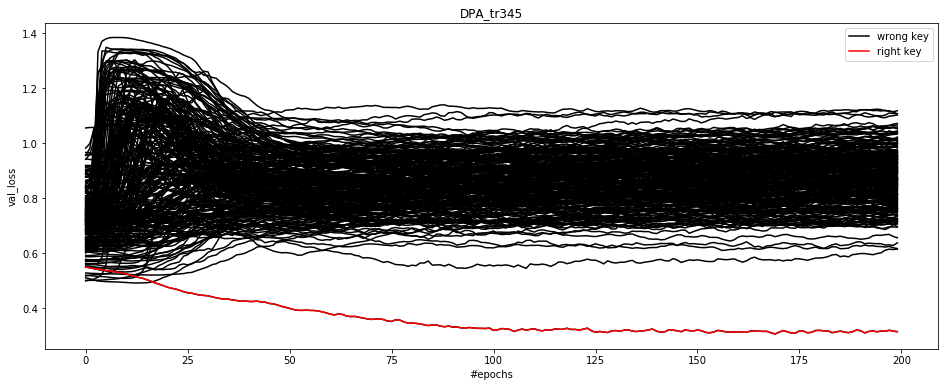

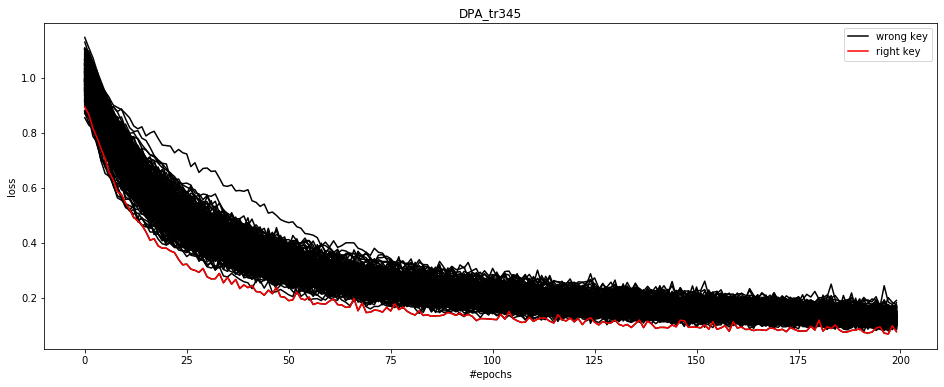

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 01:59:25.358569
Elapsed :  1054.5881111621857
right key : 0x2b, val_loss : 0.31428658962249756, loss : 0.0773442404893424
right candidate : 0x2b
 val_loss : 0.31428658962249756
 ratio : 1.9562936592126097 / 1.1104037983738568
 gap : 0.30055027283155 / 0.008539097932364445


** right key : 0x2b / #trace : 350 / target byte : 1
Training started:  2020-06-22 01:59:25.470247


100%|██████████████████████████████████████████████████| 256/256 [17:41<00:00,  4.15s/it]


Right key :  0x2b
Right candidate :  0x2b


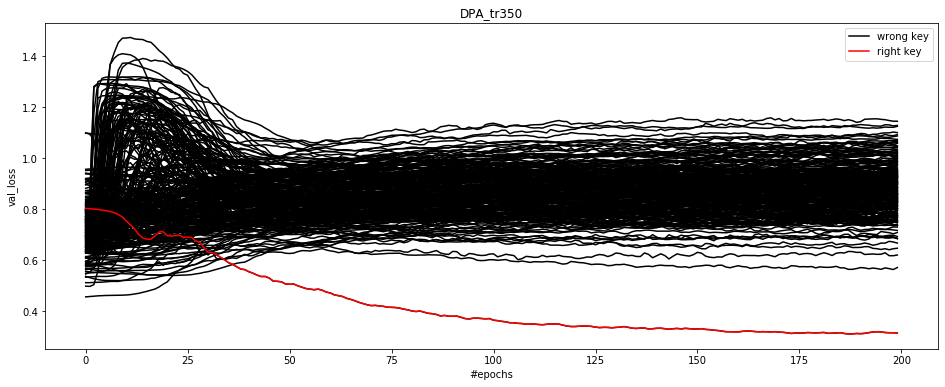

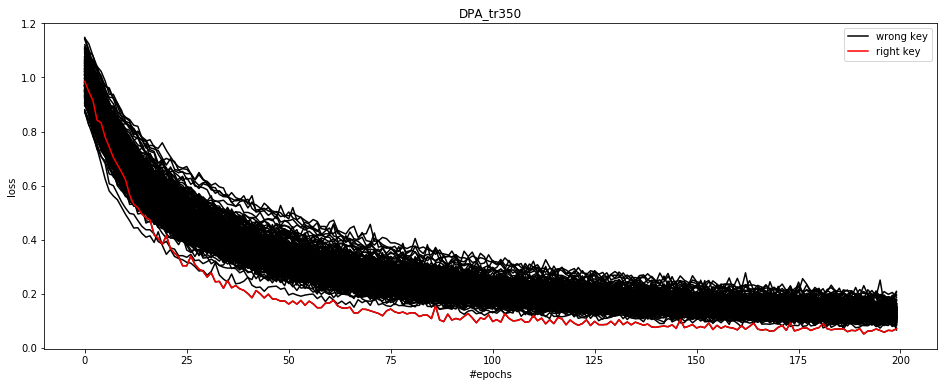

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 02:17:09.144638
Elapsed :  1063.6743912696838
right key : 0x2b, val_loss : 0.31370664655037644, loss : 0.07032538535165005
right candidate : 0x2b
 val_loss : 0.31370664655037644
 ratio : 1.8192638943436068 / 0.9353080164895334
 gap : 0.25700852893433485 / -0.004549488669536153


** right key : 0x2b / #trace : 355 / target byte : 1
Training started:  2020-06-22 02:17:09.257053


100%|██████████████████████████████████████████████████| 256/256 [17:43<00:00,  4.15s/it]


Right key :  0x2b
Right candidate :  0x2b


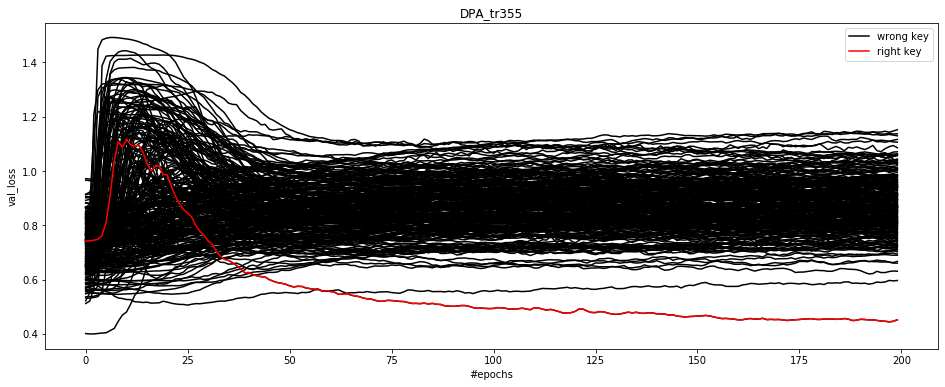

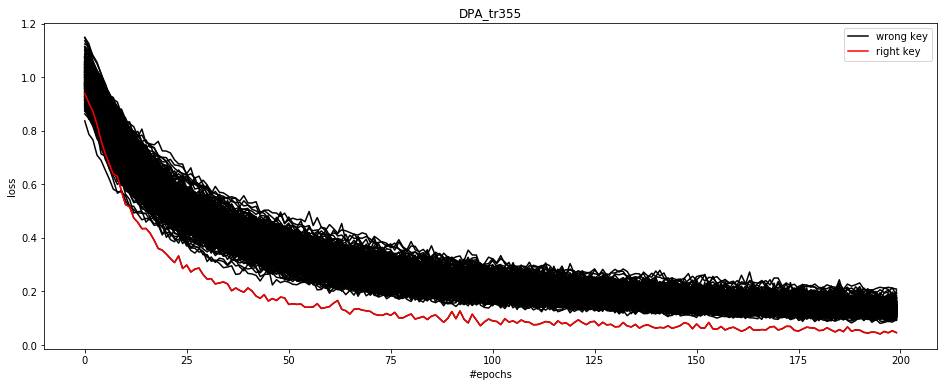

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 02:34:54.484019
Elapsed :  1065.2269668579102
right key : 0x2b, val_loss : 0.45141216694751635, loss : 0.04633164021276658
right candidate : 0x2b
 val_loss : 0.45141216694751635
 ratio : 1.3211353486957966 / 1.981519242767316
 gap : 0.14496440363821578 / 0.045475396417802384


** right key : 0x2b / #trace : 360 / target byte : 1
Training started:  2020-06-22 02:34:54.594108


100%|██████████████████████████████████████████████████| 256/256 [17:39<00:00,  4.14s/it]


Right key :  0x2b
Right candidate :  0x2b


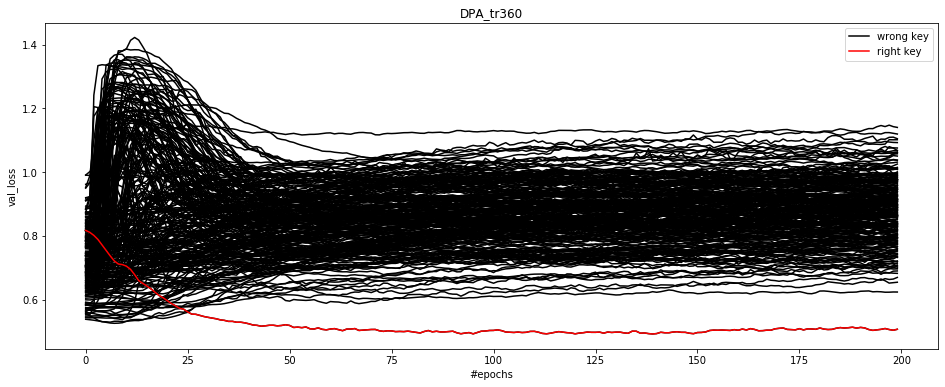

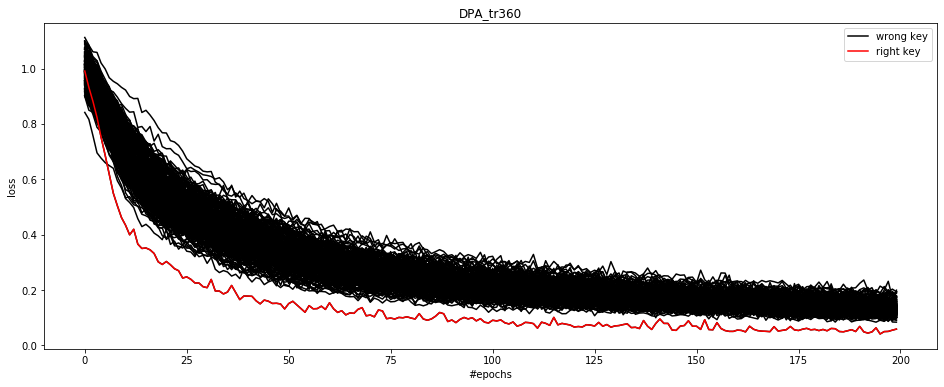

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 02:52:36.105103
Elapsed :  1061.495367527008
right key : 0x2b, val_loss : 0.5067200092000699, loss : 0.05849851840045823
right candidate : 0x2b
 val_loss : 0.5067200092000699
 ratio : 1.2306527006591366 / 1.4288602424827155
 gap : 0.11687633860001867 / 0.025087688786100105


** right key : 0x2b / #trace : 365 / target byte : 1
Training started:  2020-06-22 02:52:36.231149


100%|██████████████████████████████████████████████████| 256/256 [17:58<00:00,  4.21s/it]


Right key :  0x2b
Right candidate :  0x2b


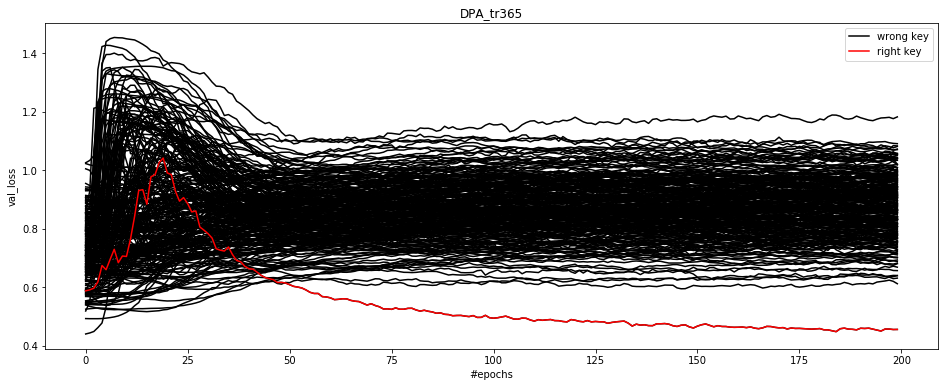

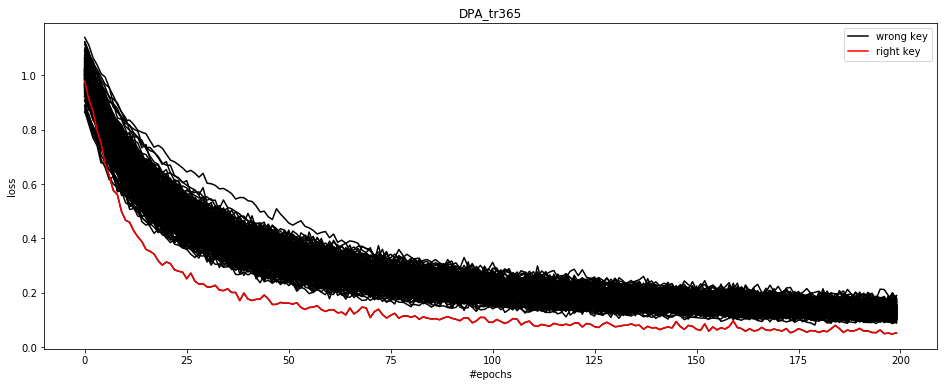

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 03:10:37.398817
Elapsed :  1081.167668581009
right key : 0x2b, val_loss : 0.45625390952283684, loss : 0.05185053840863938
right candidate : 0x2b
 val_loss : 0.45625390952283684
 ratio : 1.3425952265009529 / 1.6979486964351636
 gap : 0.15631041147492153 / 0.036189015691771236


** right key : 0x2b / #trace : 370 / target byte : 1
Training started:  2020-06-22 03:10:37.530028


100%|██████████████████████████████████████████████████| 256/256 [19:07<00:00,  4.48s/it]


Right key :  0x2b
Right candidate :  0x2b


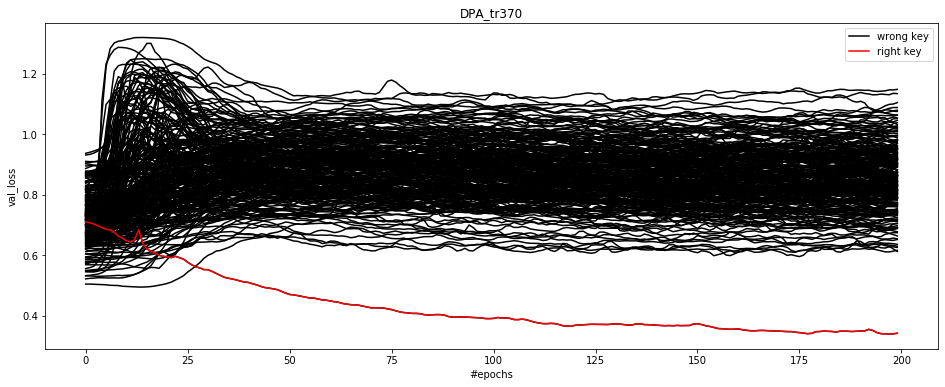

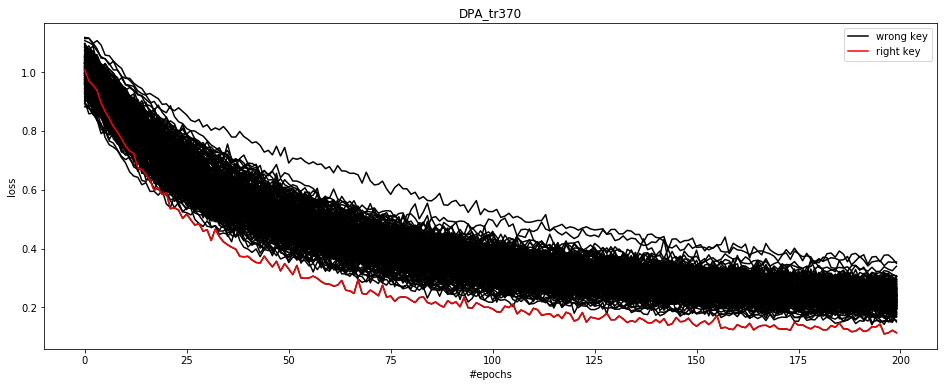

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 03:29:47.498632
Elapsed :  1149.9686045646667
right key : 0x2b, val_loss : 0.34237372767817864, loss : 0.11429178461605058
right candidate : 0x2b
 val_loss : 0.34237372767817864
 ratio : 1.7893877450809283 / 1.3196698969668224
 gap : 0.27026562486682926 / 0.03653564301236714


** right key : 0x2b / #trace : 375 / target byte : 1
Training started:  2020-06-22 03:29:47.632783


100%|██████████████████████████████████████████████████| 256/256 [18:58<00:00,  4.45s/it]


Right key :  0x2b
Right candidate :  0x2b


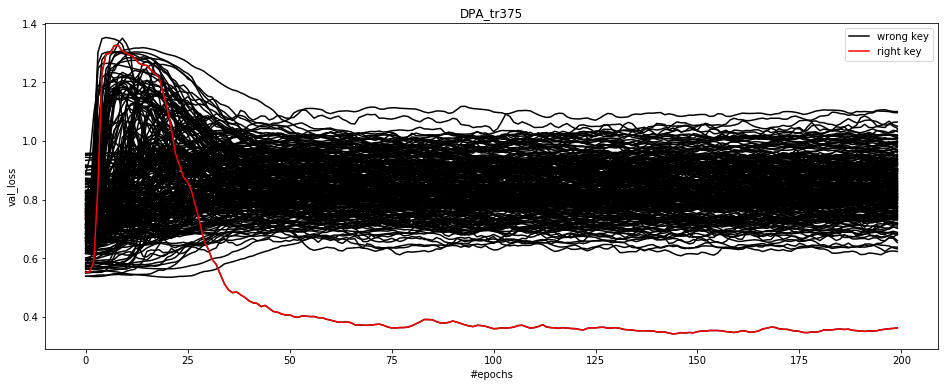

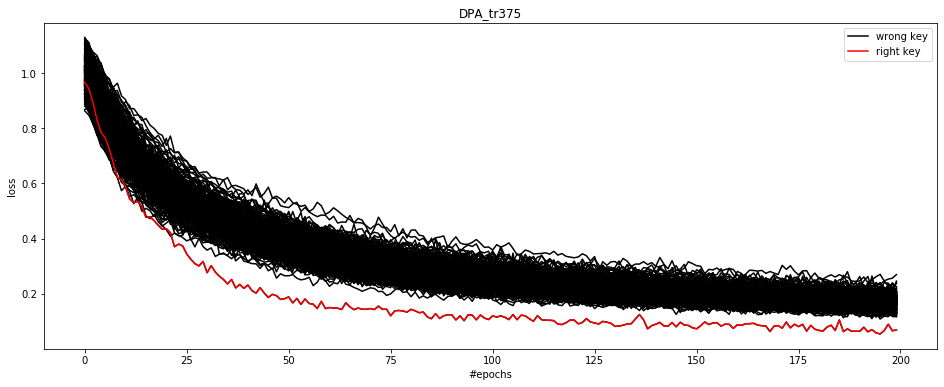

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 03:48:48.764748
Elapsed :  1141.1319651603699
right key : 0x2b, val_loss : 0.36180997844290946, loss : 0.06902416744304977
right candidate : 0x2b
 val_loss : 0.36180997844290946
 ratio : 1.7210580066976362 / 1.69682069768046
 gap : 0.260885981859359 / 0.04809746851447884


** right key : 0x2b / #trace : 380 / target byte : 1
Training started:  2020-06-22 03:48:48.898792


100%|██████████████████████████████████████████████████| 256/256 [19:10<00:00,  4.49s/it]


Right key :  0x2b
Right candidate :  0x2b


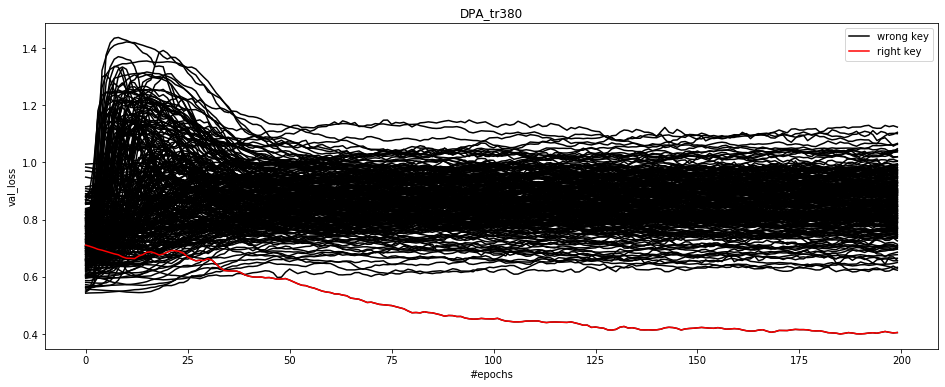

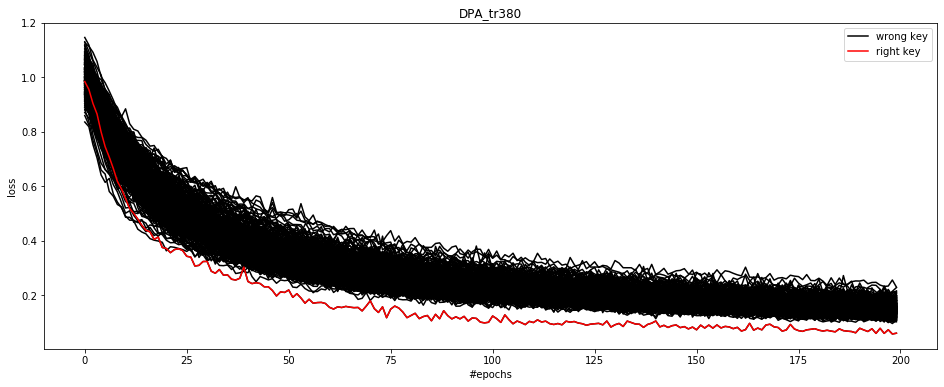

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 04:08:01.540637
Elapsed :  1152.6418452262878
right key : 0x2b, val_loss : 0.4052471455774809, loss : 0.060367080950199214
right candidate : 0x2b
 val_loss : 0.4052471455774809
 ratio : 1.5378959333361713 / 1.6940847264573446
 gap : 0.21798079160221834 / 0.0418998688683474


** right key : 0x2b / #trace : 385 / target byte : 1
Training started:  2020-06-22 04:08:01.669988


100%|██████████████████████████████████████████████████| 256/256 [19:01<00:00,  4.46s/it]


Right key :  0x2b
Right candidate :  0x2b


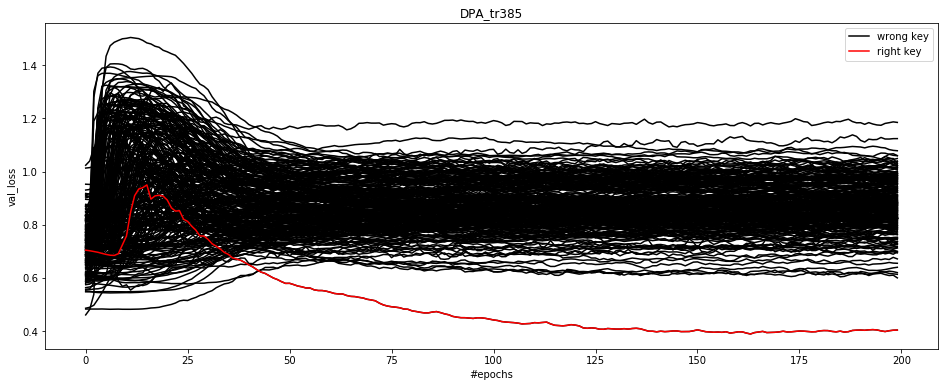

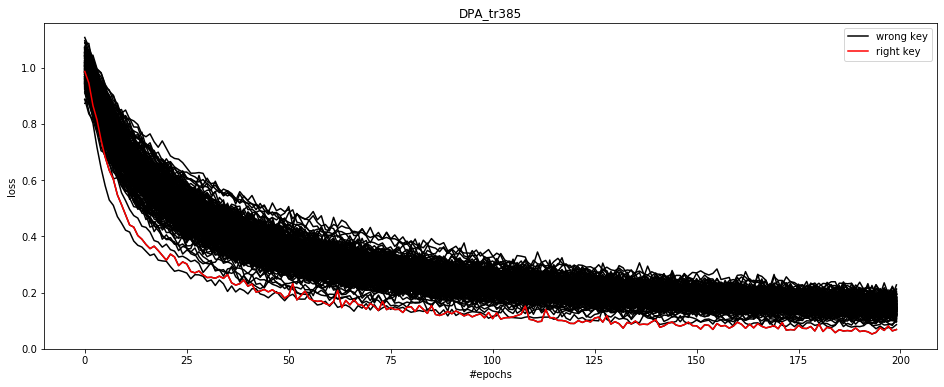

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 04:27:04.987617
Elapsed :  1143.3166272640228
right key : 0x2b, val_loss : 0.4035098408830577, loss : 0.06846590822070948
right candidate : 0x2b
 val_loss : 0.4035098408830577
 ratio : 1.4866121778943895 / 1.2532158577546944
 gap : 0.19635280247392323 / 0.017336653677061137


** right key : 0x2b / #trace : 390 / target byte : 1
Training started:  2020-06-22 04:27:05.114062


100%|██████████████████████████████████████████████████| 256/256 [19:27<00:00,  4.56s/it]


Right key :  0x2b
Right candidate :  0x2b


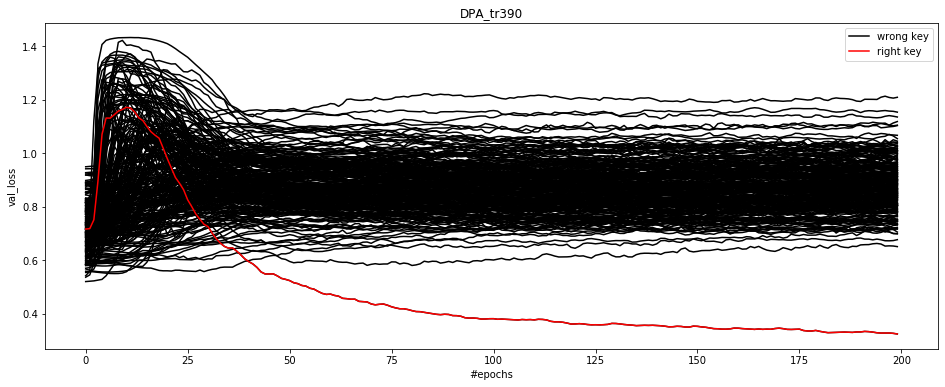

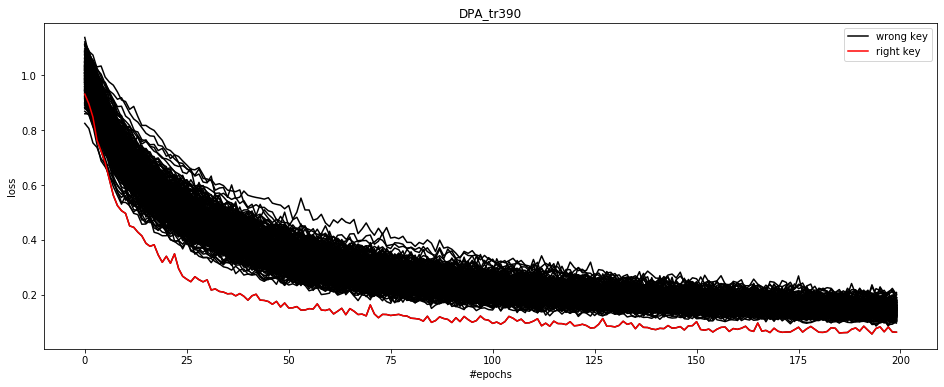

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 04:46:34.219638
Elapsed :  1169.1055755615234
right key : 0x2b, val_loss : 0.3250173595216539, loss : 0.06287964818241833
right candidate : 0x2b
 val_loss : 0.3250173595216539
 ratio : 2.004213794311406 / 1.5305595808723749
 gap : 0.3263869158223144 / 0.03336139978506626


** right key : 0x2b / #trace : 395 / target byte : 1
Training started:  2020-06-22 04:46:34.338253


100%|██████████████████████████████████████████████████| 256/256 [19:21<00:00,  4.54s/it]


Right key :  0x2b
Right candidate :  0x2b


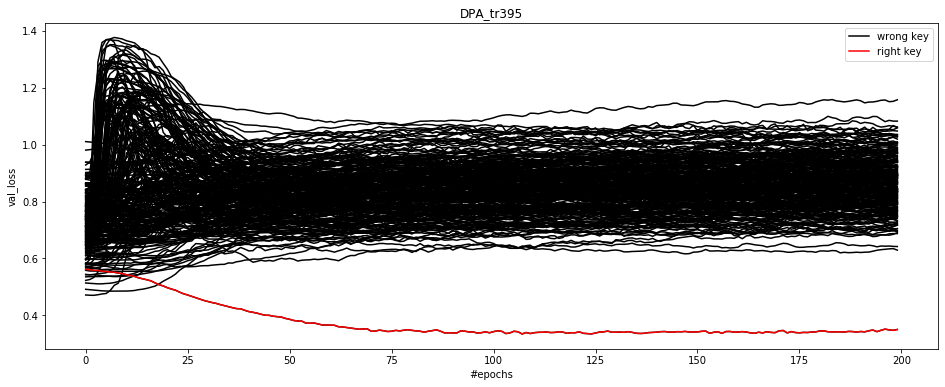

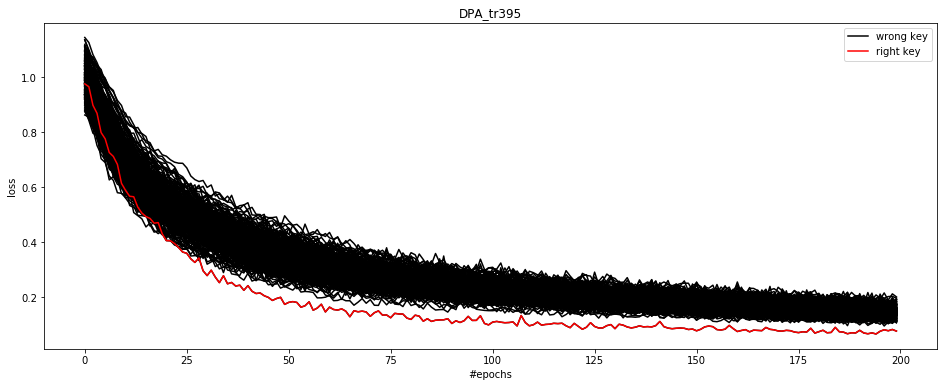

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 05:05:57.572940
Elapsed :  1163.2346868515015
right key : 0x2b, val_loss : 0.35017307015026317, loss : 0.07605363925298055
right candidate : 0x2b
 val_loss : 0.35017307015026317
 ratio : 1.7970340051111848 / 1.3979450787106105
 gap : 0.27909984458394416 / 0.03026517145875572


** right key : 0x2b / #trace : 400 / target byte : 1
Training started:  2020-06-22 05:05:57.692961


100%|██████████████████████████████████████████████████| 256/256 [19:32<00:00,  4.58s/it]


Right key :  0x2b
Right candidate :  0x2b


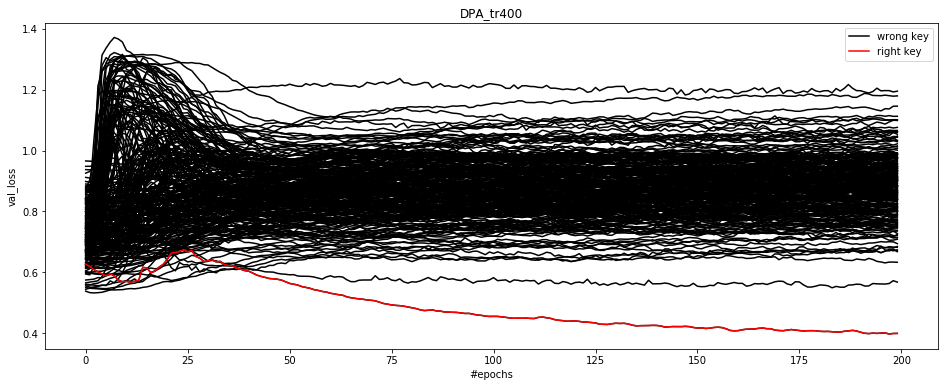

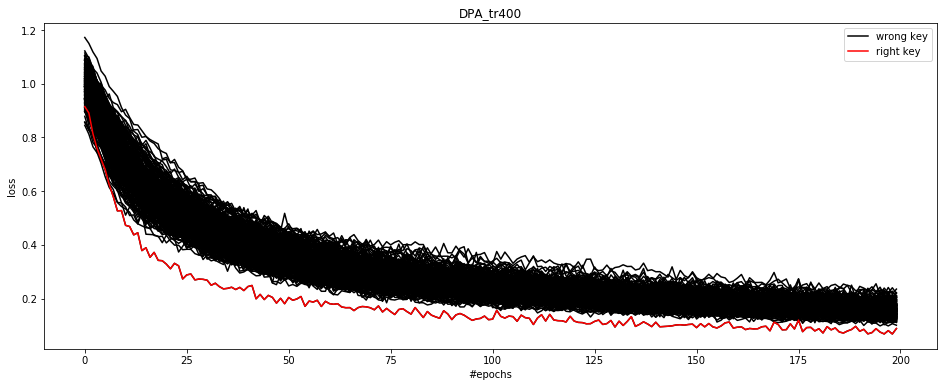

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 05:25:32.023692
Elapsed :  1174.3307311534882
right key : 0x2b, val_loss : 0.3994259039560954, loss : 0.08884301866803851
right candidate : 0x2b
 val_loss : 0.3994259039560954
 ratio : 1.4217718333740885 / 1.1391692797203419
 gap : 0.1684665958086649 / 0.012364218916211811


** right key : 0x2b / #trace : 405 / target byte : 1
Training started:  2020-06-22 05:25:32.161648


100%|██████████████████████████████████████████████████| 256/256 [19:32<00:00,  4.58s/it]


Right key :  0x2b
Right candidate :  0x2b


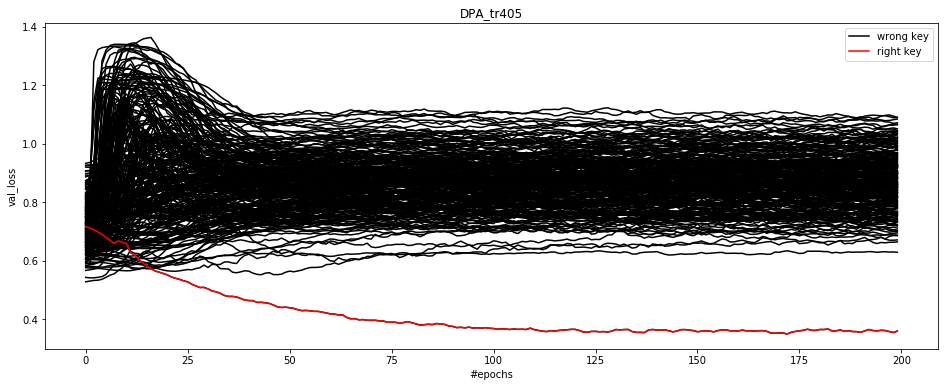

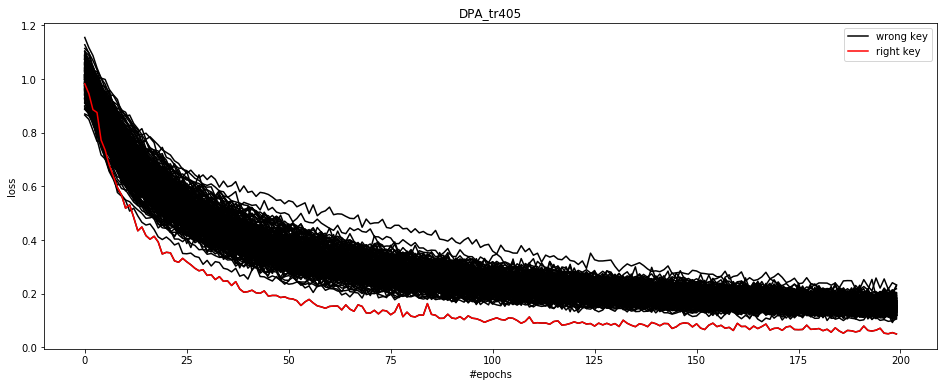

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 05:45:07.061075
Elapsed :  1174.8994271755219
right key : 0x2b, val_loss : 0.35981684141471737, loss : 0.049943387929626576
right candidate : 0x2b
 val_loss : 0.35981684141471737
 ratio : 1.7486395354801783 / 2.1202373401984063
 gap : 0.26937311301465894 / 0.055948448054782066


** right key : 0x2b / #trace : 410 / target byte : 1
Training started:  2020-06-22 05:45:07.177135


100%|██████████████████████████████████████████████████| 256/256 [19:34<00:00,  4.59s/it]


Right key :  0x2b
Right candidate :  0x2b


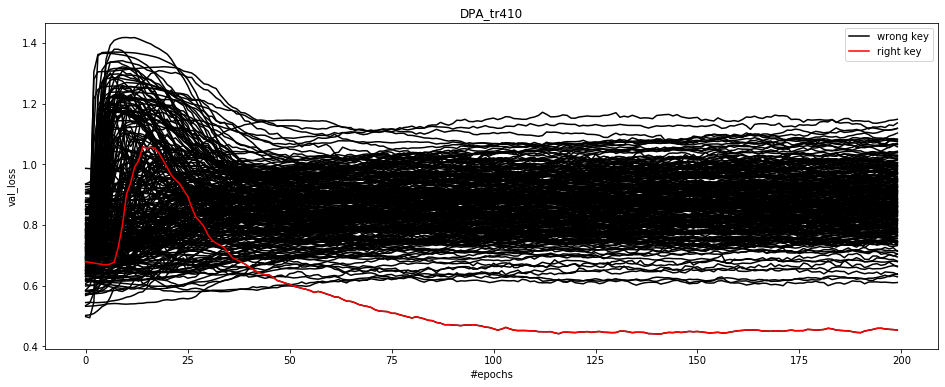

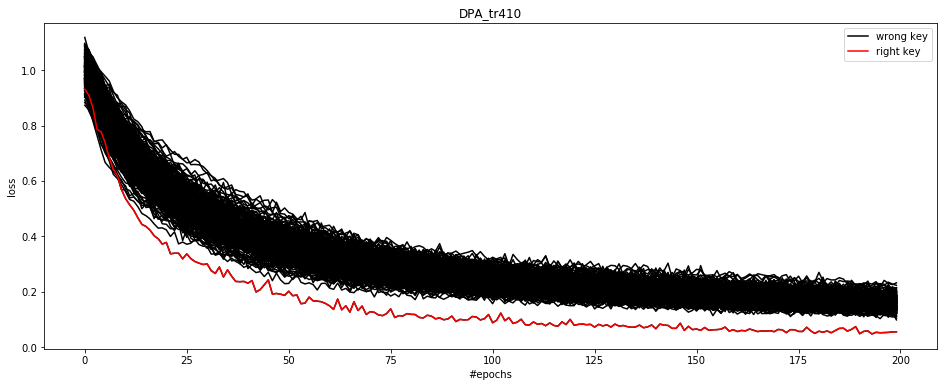

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 06:04:44.082732
Elapsed :  1176.9045975208282
right key : 0x2b, val_loss : 0.4530201336232627, loss : 0.05521408273783295
right candidate : 0x2b
 val_loss : 0.4530201336232627
 ratio : 1.3464207609346226 / 1.7810510441061473
 gap : 0.15693557940847508 / 0.043125016971747636


** right key : 0x2b / #trace : 415 / target byte : 1
Training started:  2020-06-22 06:04:44.209906


100%|██████████████████████████████████████████████████| 256/256 [20:53<00:00,  4.89s/it]


Right key :  0x2b
Right candidate :  0x2b


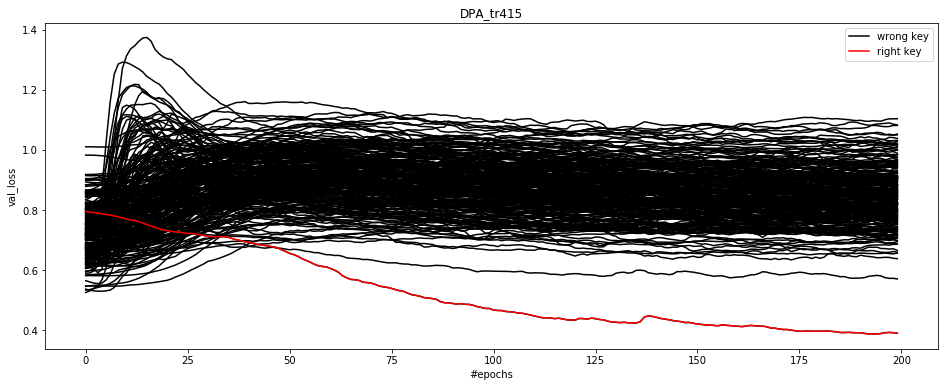

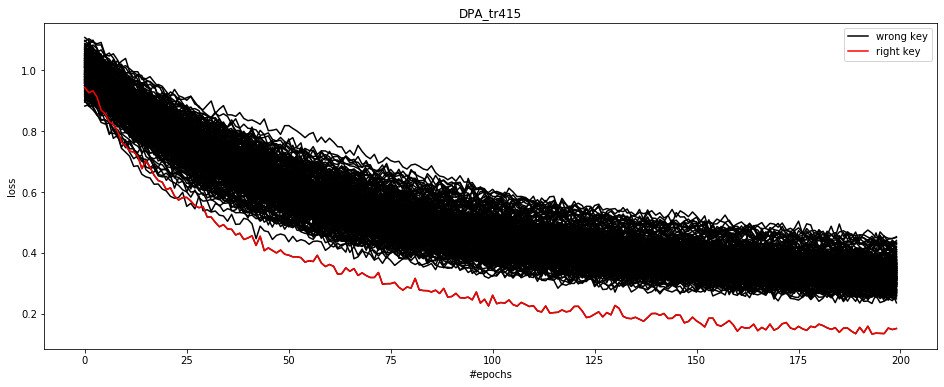

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 06:25:39.369436
Elapsed :  1255.158529996872
right key : 0x2b, val_loss : 0.390355028629303, loss : 0.1513330973427871
right candidate : 0x2b
 val_loss : 0.390355028629303
 ratio : 1.4616387969962576 / 1.5588859745766717
 gap : 0.18020302581787112 / 0.0845779455941299


** right key : 0x2b / #trace : 420 / target byte : 1
Training started:  2020-06-22 06:25:39.479857


100%|██████████████████████████████████████████████████| 256/256 [20:50<00:00,  4.88s/it]


Right key :  0x2b
Right candidate :  0x2b


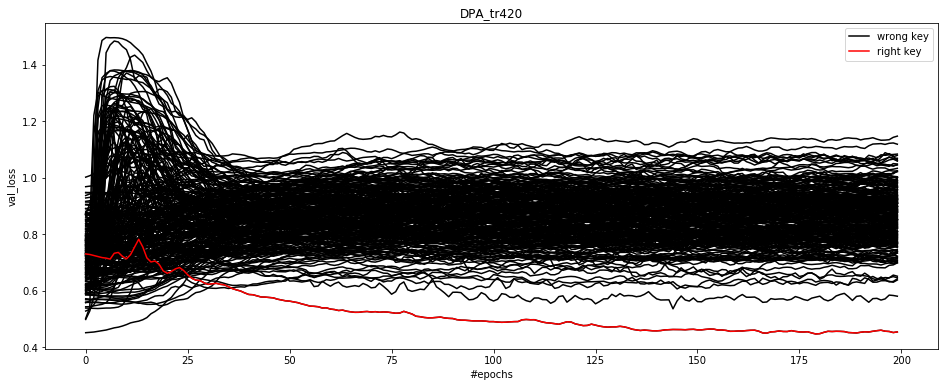

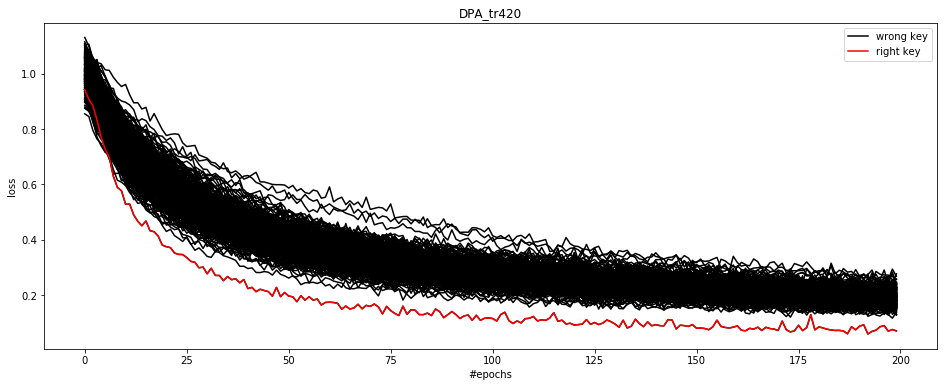

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 06:46:32.159958
Elapsed :  1252.680101633072
right key : 0x2b, val_loss : 0.4541348819694822, loss : 0.07134893881220396
right candidate : 0x2b
 val_loss : 0.4541348819694822
 ratio : 1.2785652409433932 / 1.807680456954315
 gap : 0.12650619281662828 / 0.05762714350304636


** right key : 0x2b / #trace : 425 / target byte : 1
Training started:  2020-06-22 06:46:32.277539


100%|██████████████████████████████████████████████████| 256/256 [21:08<00:00,  4.96s/it]


Right key :  0x2b
Right candidate :  0x2b


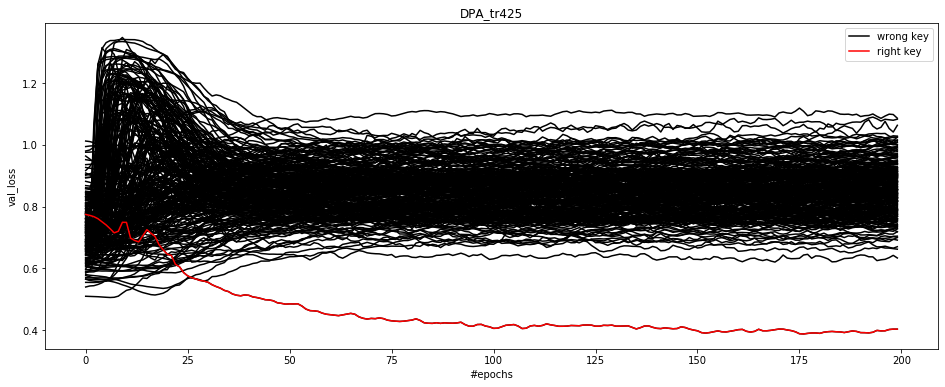

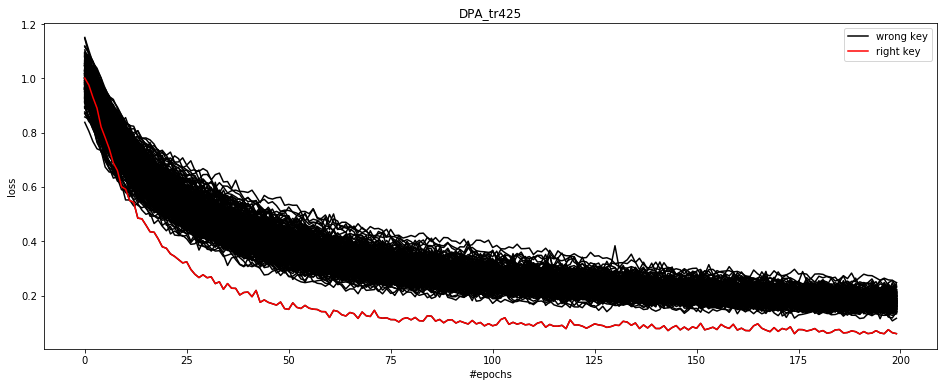

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 07:07:43.120614
Elapsed :  1270.8430752754211
right key : 0x2b, val_loss : 0.40370601415634155, loss : 0.05952048121076642
right candidate : 0x2b
 val_loss : 0.40370601415634155
 ratio : 1.5701549653384297 / 1.948766791837688
 gap : 0.2301749885082245 / 0.056471056006974246


** right key : 0x2b / #trace : 430 / target byte : 1
Training started:  2020-06-22 07:07:43.255490


100%|██████████████████████████████████████████████████| 256/256 [21:32<00:00,  5.05s/it]


Right key :  0x2b
Right candidate :  0x2b


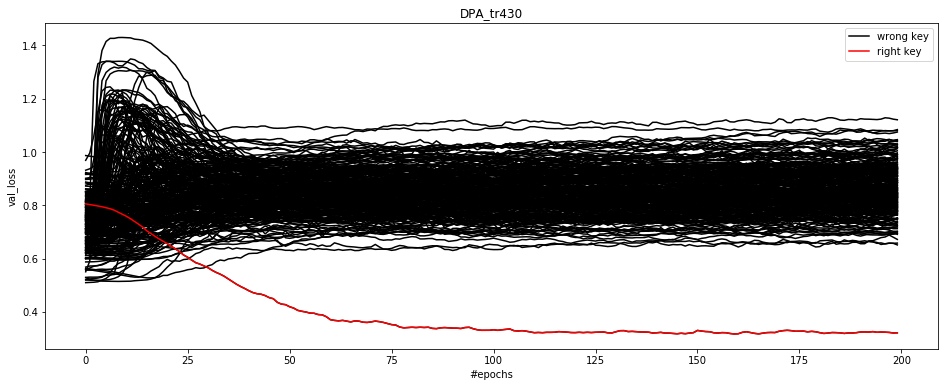

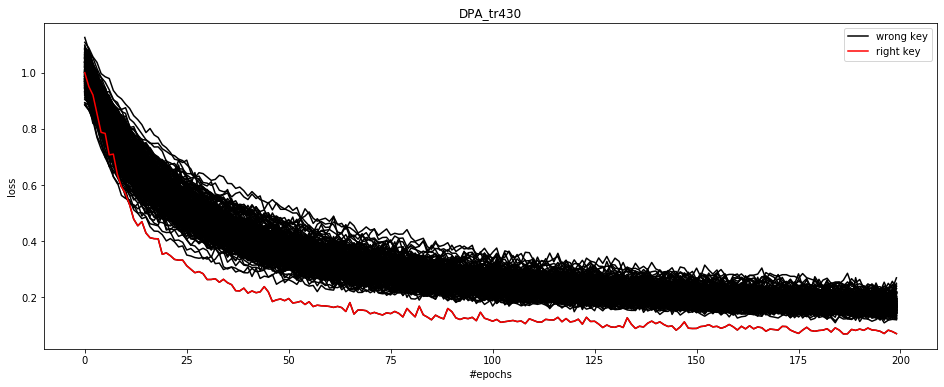

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 07:29:18.443427
Elapsed :  1295.186946630478
right key : 0x2b, val_loss : 0.3214976006700087, loss : 0.07115373116890061
right candidate : 0x2b
 val_loss : 0.3214976006700087
 ratio : 2.025574598216087 / 1.6930868030208874
 gap : 0.32971977263458013 / 0.049315712058861


** right key : 0x2b / #trace : 435 / target byte : 1
Training started:  2020-06-22 07:29:18.572097


100%|██████████████████████████████████████████████████| 256/256 [21:52<00:00,  5.13s/it]


Right key :  0x2b
Right candidate :  0x2b


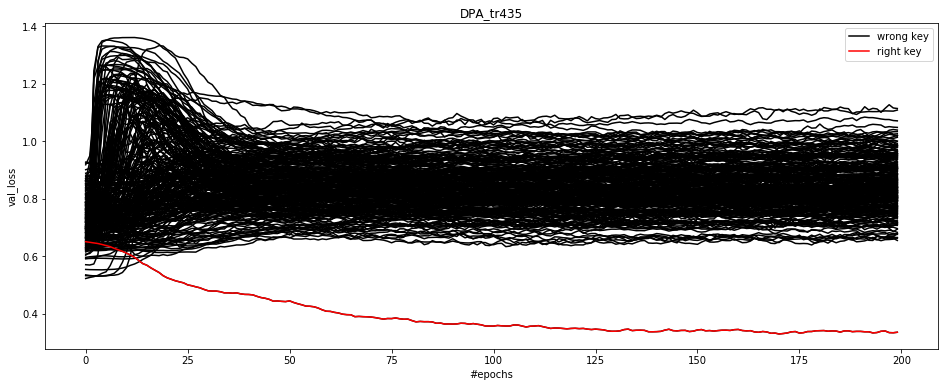

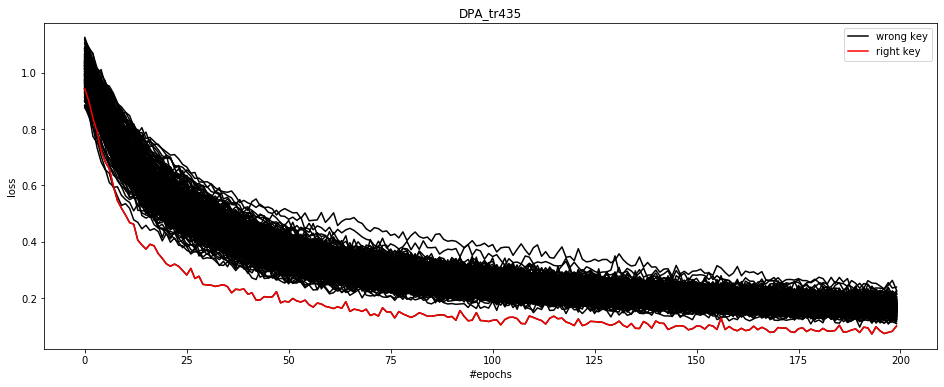

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 07:51:12.760602
Elapsed :  1314.1885056495667
right key : 0x2b, val_loss : 0.33500512911163216, loss : 0.10052109705774408
right candidate : 0x2b
 val_loss : 0.33500512911163216
 ratio : 1.9538851567240034 / 1.0915327705717777
 gap : 0.3195564200859943 / 0.009200974514609883


** right key : 0x2b / #trace : 440 / target byte : 1
Training started:  2020-06-22 07:51:12.878383


100%|██████████████████████████████████████████████████| 256/256 [21:50<00:00,  5.12s/it]


Right key :  0x2b
Right candidate :  0x2b


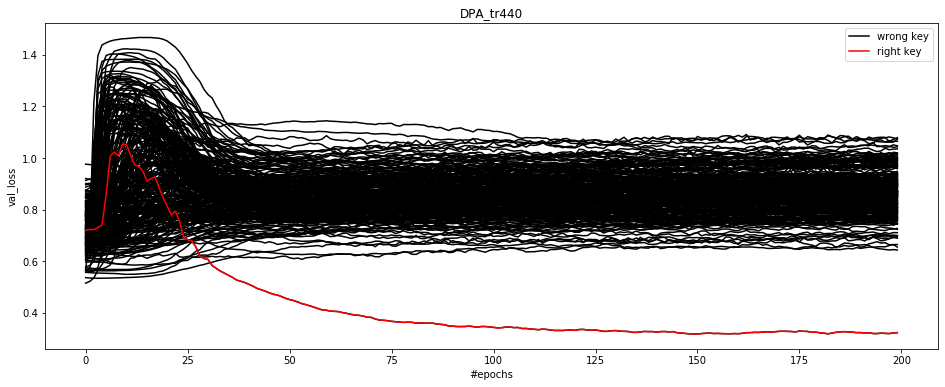

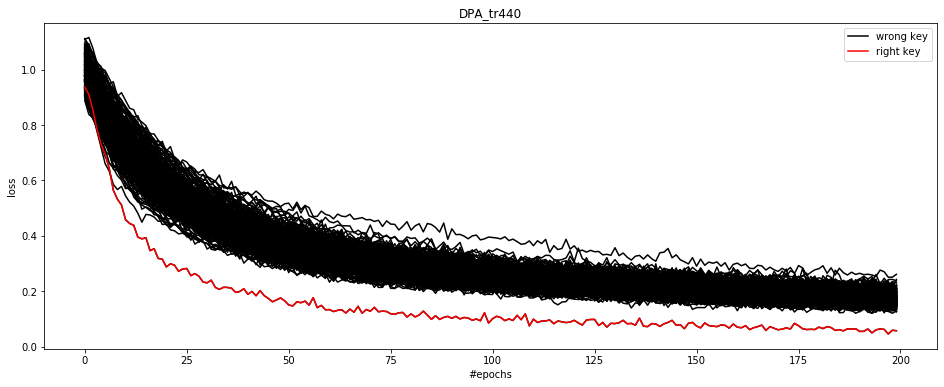

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 08:13:05.918265
Elapsed :  1313.0398819446564
right key : 0x2b, val_loss : 0.32355903856682056, loss : 0.057513825305096515
right candidate : 0x2b
 val_loss : 0.32355903856682056
 ratio : 1.9891619502245244 / 2.1922337322943743
 gap : 0.3200522896015283 / 0.06856992260202185


** right key : 0x2b / #trace : 445 / target byte : 1
Training started:  2020-06-22 08:13:06.035175


100%|██████████████████████████████████████████████████| 256/256 [21:44<00:00,  5.10s/it]


Right key :  0x2b
Right candidate :  0x2b


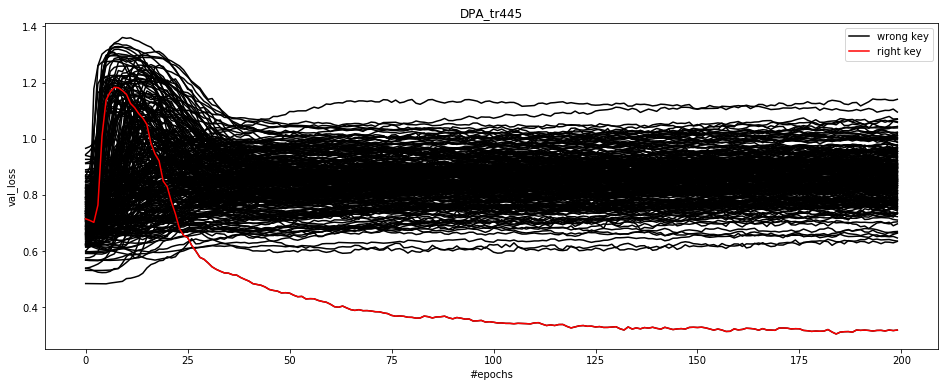

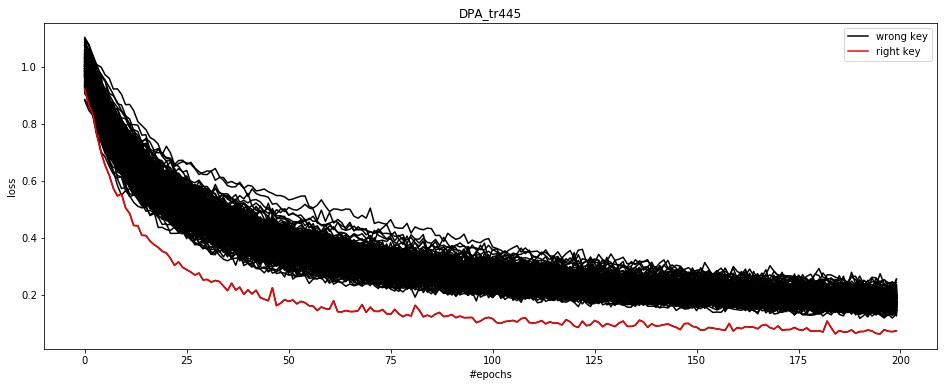

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 08:34:53.139920
Elapsed :  1307.104744195938
right key : 0x2b, val_loss : 0.3186070883452003, loss : 0.0737609679292636
right candidate : 0x2b
 val_loss : 0.3186070883452003
 ratio : 1.990622522322247 / 1.7106293135796498
 gap : 0.3156193574862693 / 0.052416706008543146


** right key : 0x2b / #trace : 450 / target byte : 1
Training started:  2020-06-22 08:34:53.268456


100%|██████████████████████████████████████████████████| 256/256 [22:03<00:00,  5.17s/it]


Right key :  0x2b
Right candidate :  0x2b


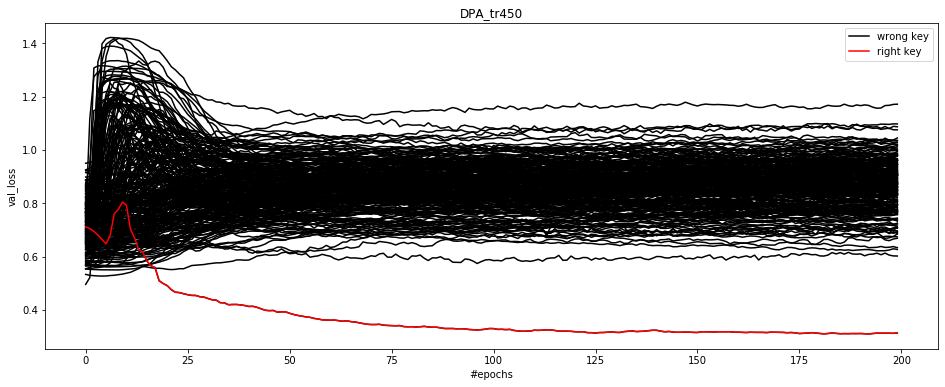

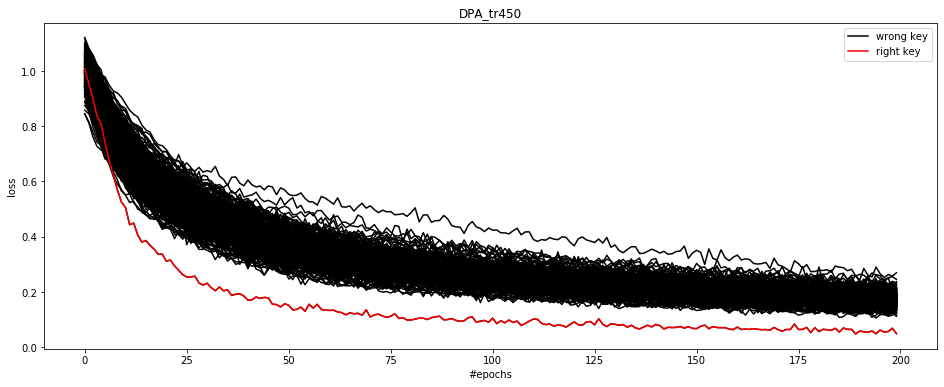

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 08:56:58.620329
Elapsed :  1325.3518733978271
right key : 0x2b, val_loss : 0.3133826188467167, loss : 0.04920969425685822
right candidate : 0x2b
 val_loss : 0.3133826188467167
 ratio : 1.9208288373318514 / 2.2930831664061713
 gap : 0.2885717525526329 / 0.06363222726753781


** right key : 0x2b / #trace : 455 / target byte : 1
Training started:  2020-06-22 08:56:58.745814


100%|██████████████████████████████████████████████████| 256/256 [21:59<00:00,  5.15s/it]


Right key :  0x2b
Right candidate :  0x2b


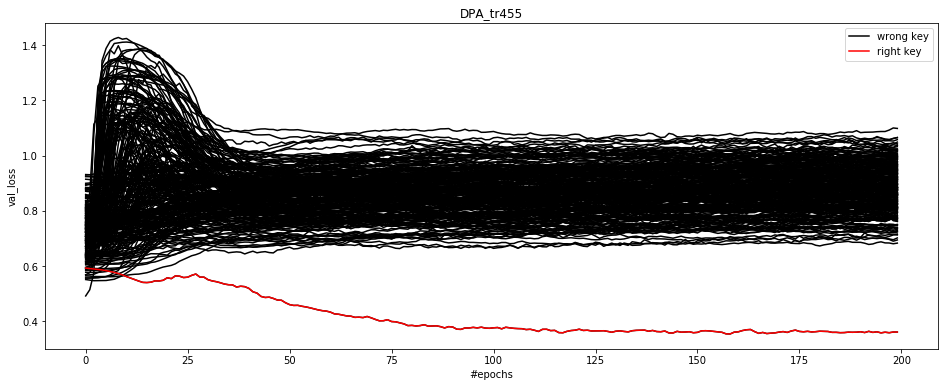

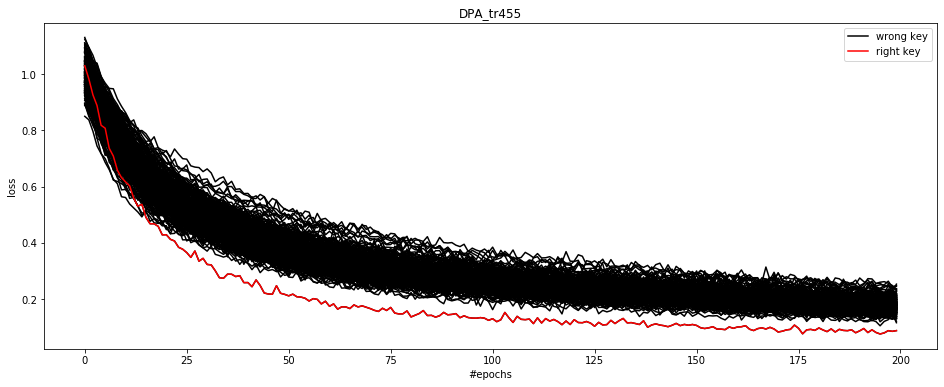

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 09:19:00.420952
Elapsed :  1321.675137758255
right key : 0x2b, val_loss : 0.3618114547137796, loss : 0.08842335289941644
right candidate : 0x2b
 val_loss : 0.3618114547137796
 ratio : 1.8891002001220796 / 1.317408684856963
 gap : 0.3216866367924822 / 0.028066340154446895


** right key : 0x2b / #trace : 460 / target byte : 1
Training started:  2020-06-22 09:19:00.553382


100%|██████████████████████████████████████████████████| 256/256 [23:10<00:00,  5.43s/it]


Right key :  0x2b
Right candidate :  0x2b


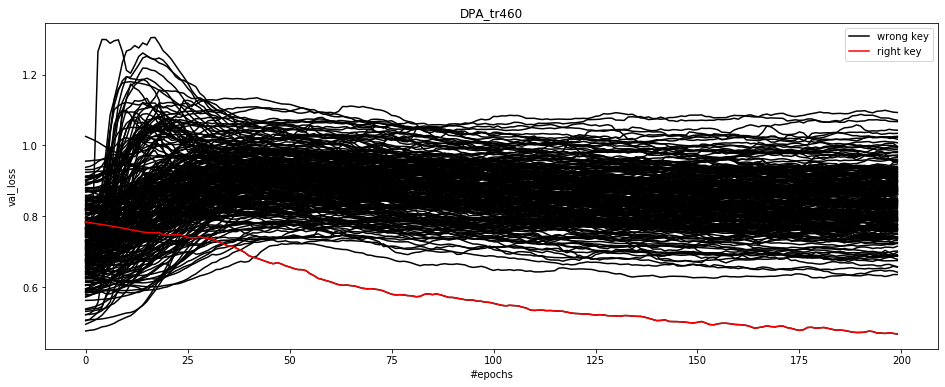

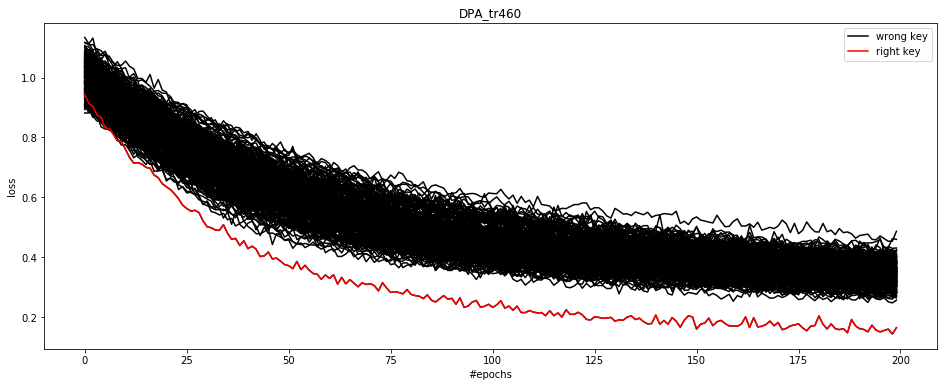

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 09:42:13.285564
Elapsed :  1392.732182264328
right key : 0x2b, val_loss : 0.4674704541330752, loss : 0.16404561596627562
right candidate : 0x2b
 val_loss : 0.4674704541330752
 ratio : 1.359190297366692 / 1.5615394151503539
 gap : 0.1679108514302019 / 0.09211807924768198


** right key : 0x2b / #trace : 465 / target byte : 1
Training started:  2020-06-22 09:42:13.418772


100%|██████████████████████████████████████████████████| 256/256 [23:17<00:00,  5.46s/it]


Right key :  0x2b
Right candidate :  0x2b


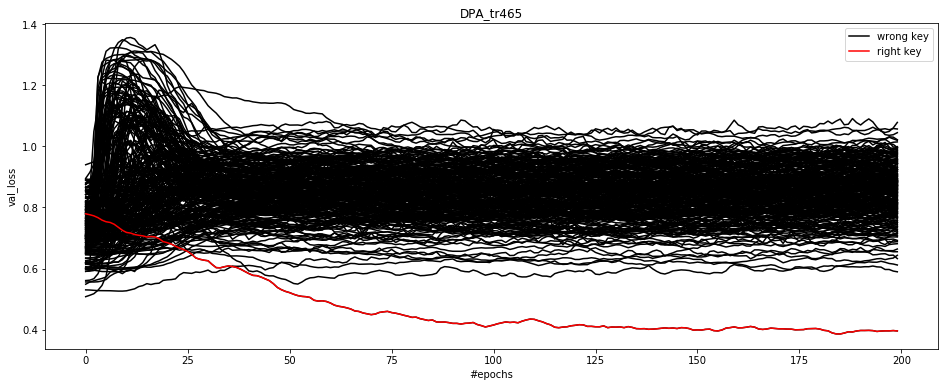

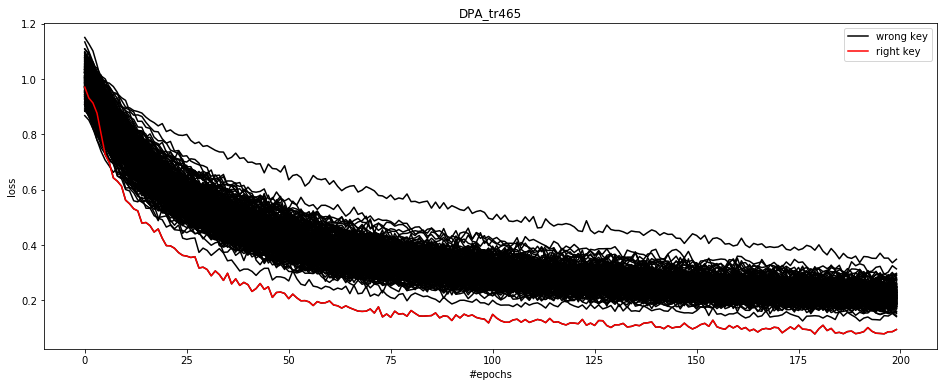

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 10:05:33.151557
Elapsed :  1399.7327847480774
right key : 0x2b, val_loss : 0.39583319084984914, loss : 0.09414888858795166
right candidate : 0x2b
 val_loss : 0.39583319084984914
 ratio : 1.4890264564824507 / 1.4955156894133566
 gap : 0.19357290267944338 / 0.046652251436160155


** right key : 0x2b / #trace : 470 / target byte : 1
Training started:  2020-06-22 10:05:33.271610


100%|██████████████████████████████████████████████████| 256/256 [23:39<00:00,  5.54s/it]


Right key :  0x2b
Right candidate :  0x2b


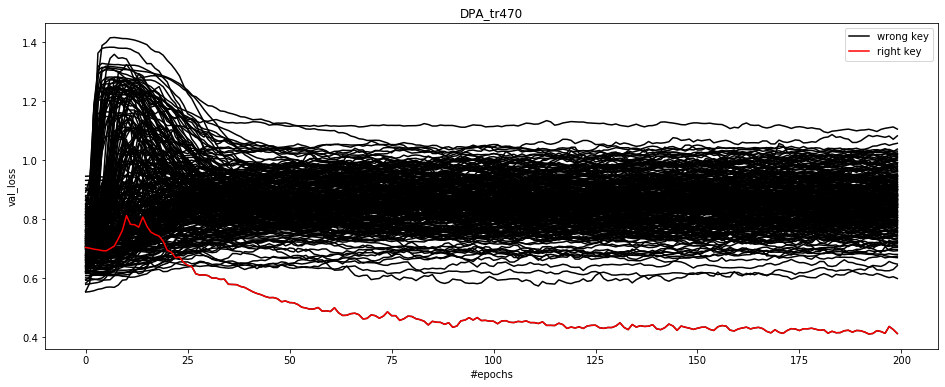

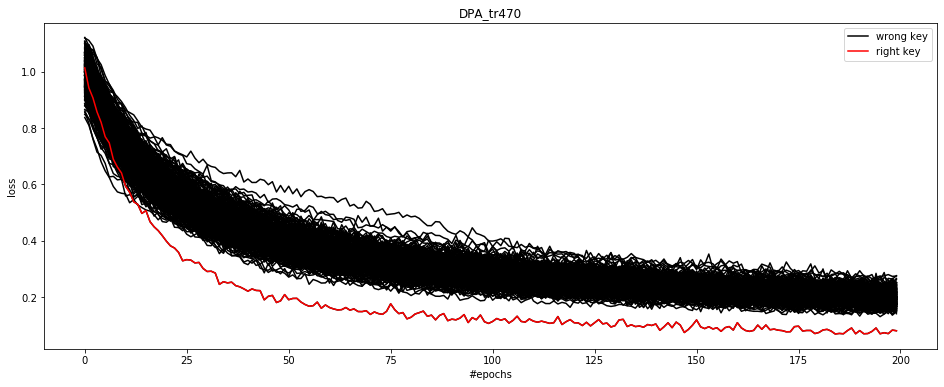

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 10:29:14.580639
Elapsed :  1421.3090288639069
right key : 0x2b, val_loss : 0.41302757948002916, loss : 0.08103690556842143
right candidate : 0x2b
 val_loss : 0.41302757948002916
 ratio : 1.4510752351197507 / 1.7447454948984242
 gap : 0.18630651252489566 / 0.06035187034259089


** right key : 0x2b / #trace : 475 / target byte : 1
Training started:  2020-06-22 10:29:14.702099


100%|██████████████████████████████████████████████████| 256/256 [23:28<00:00,  5.50s/it]


Right key :  0x2b
Right candidate :  0x2b


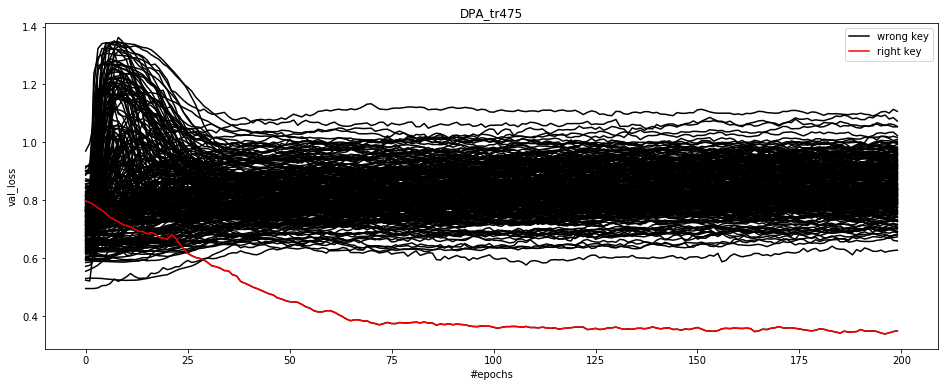

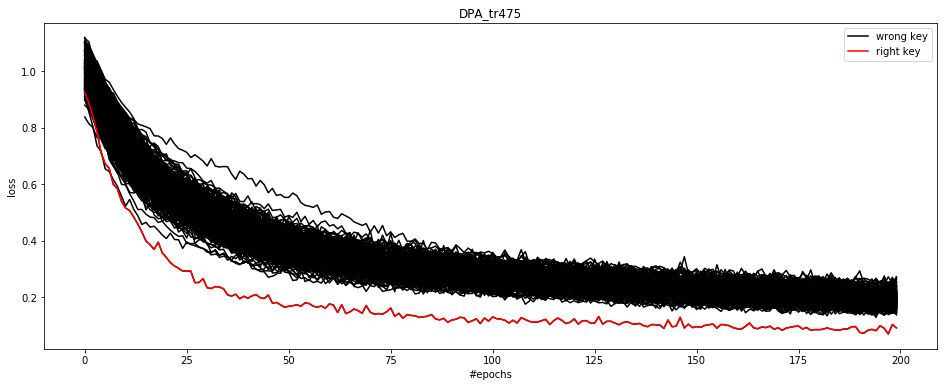

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 10:52:45.826469
Elapsed :  1411.1243703365326
right key : 0x2b, val_loss : 0.34924991731043464, loss : 0.09253486524145287
right candidate : 0x2b
 val_loss : 0.34924991731043464
 ratio : 1.7976677347502326 / 1.4980427785124415
 gap : 0.27858539040272046 / 0.046086321394127536


** right key : 0x2b / #trace : 480 / target byte : 1
Training started:  2020-06-22 10:52:45.954390


100%|██████████████████████████████████████████████████| 256/256 [23:18<00:00,  5.46s/it]


Right key :  0x2b
Right candidate :  0x2b


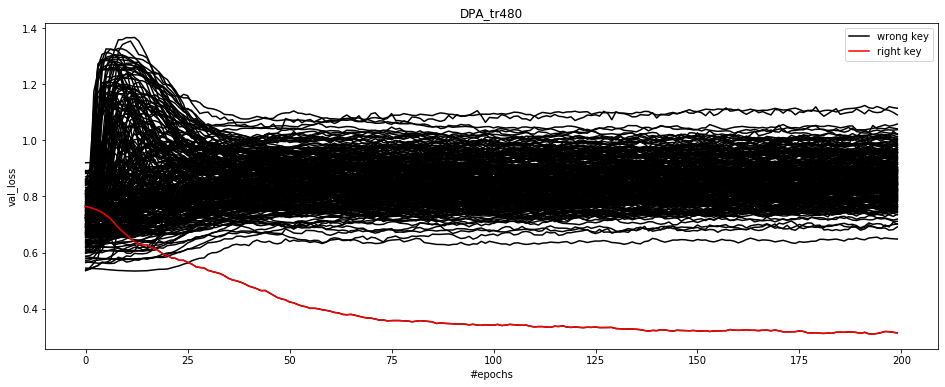

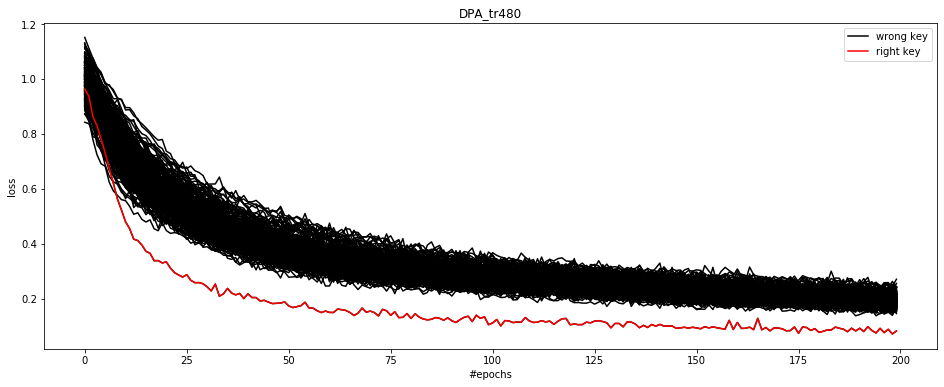

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 11:16:07.125649
Elapsed :  1401.1712589263916
right key : 0x2b, val_loss : 0.3135821885532803, loss : 0.08229453506923858
right candidate : 0x2b
 val_loss : 0.3135821885532803
 ratio : 2.06638062950211 / 1.7722953092206193
 gap : 0.3343979716300965 / 0.0635556834084647


** right key : 0x2b / #trace : 485 / target byte : 1
Training started:  2020-06-22 11:16:07.238145


100%|██████████████████████████████████████████████████| 256/256 [23:37<00:00,  5.54s/it]


Right key :  0x2b
Right candidate :  0x2b


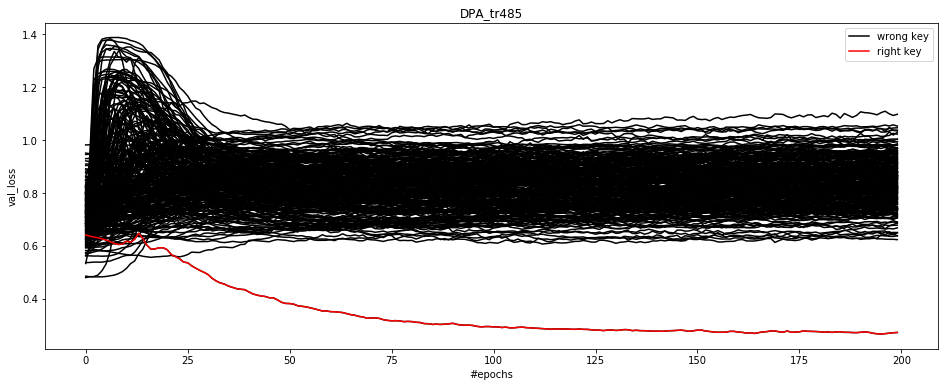

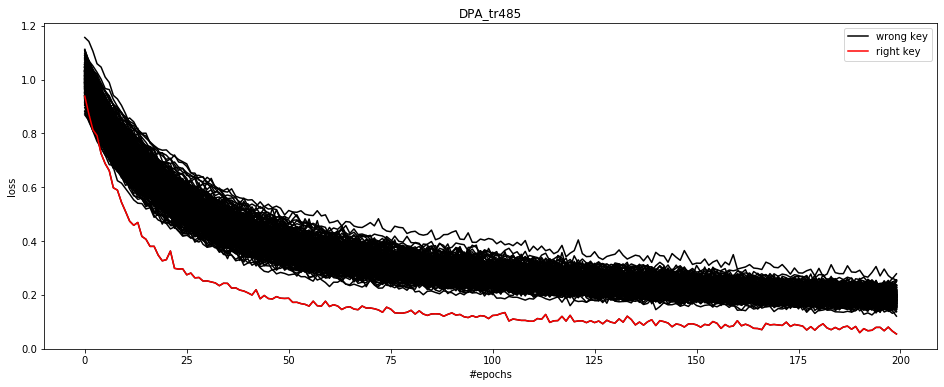

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 11:39:46.639137
Elapsed :  1419.4009919166565
right key : 0x2b, val_loss : 0.2719767755025054, loss : 0.0545199597831321
right candidate : 0x2b
 val_loss : 0.2719767755025054
 ratio : 2.2914690139092393 / 2.214760273505977
 gap : 0.3512495780644352 / 0.0662286812576924


** right key : 0x2b / #trace : 490 / target byte : 1
Training started:  2020-06-22 11:39:46.753512


100%|██████████████████████████████████████████████████| 256/256 [23:35<00:00,  5.53s/it]


Right key :  0x2b
Right candidate :  0x2b


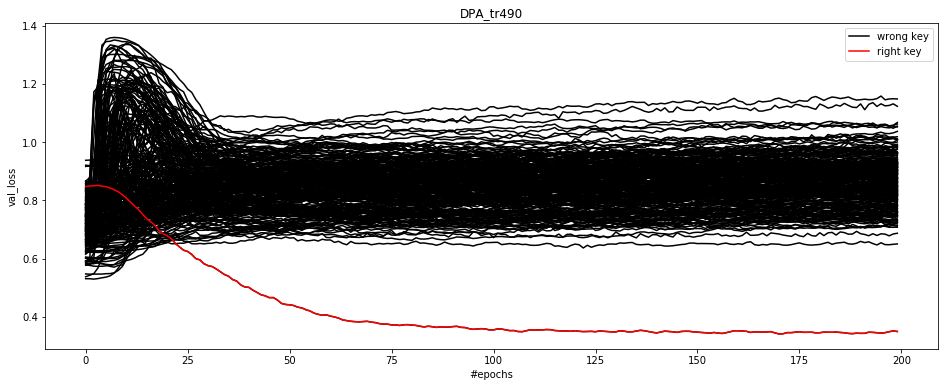

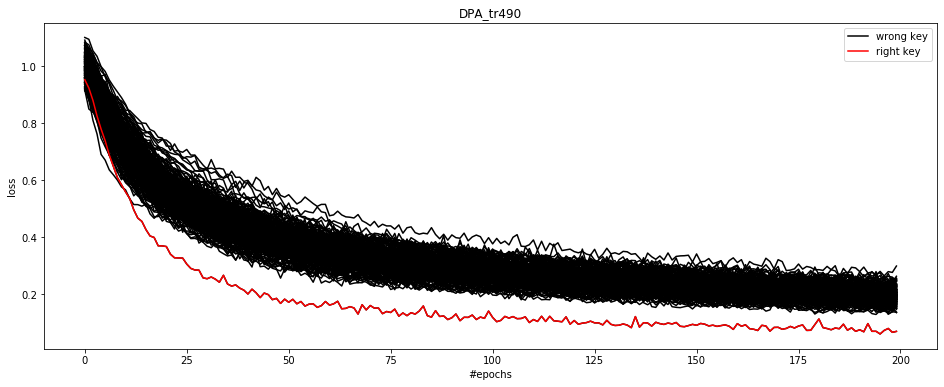

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 12:03:24.025487
Elapsed :  1417.2719757556915
right key : 0x2b, val_loss : 0.3500025162891466, loss : 0.07046718169926902
right candidate : 0x2b
 val_loss : 0.3500025162891466
 ratio : 1.8587534501182317 / 1.93612108511627
 gap : 0.3005658684133672 / 0.06596581459740508


** right key : 0x2b / #trace : 495 / target byte : 1
Training started:  2020-06-22 12:03:24.135320


100%|██████████████████████████████████████████████████| 256/256 [24:01<00:00,  5.63s/it]


Right key :  0x2b
Right candidate :  0x2b


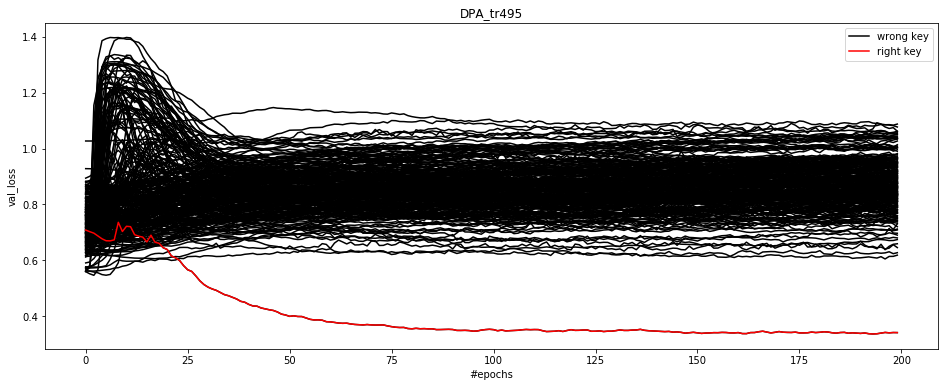

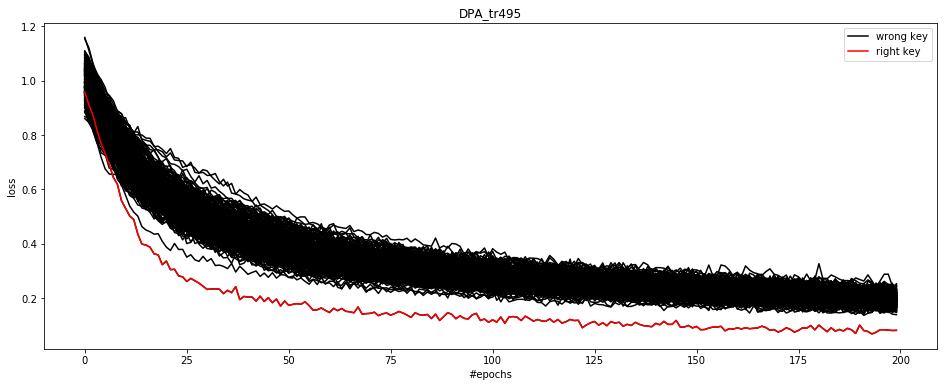

  0%|                                                            | 0/256 [00:00<?, ?it/s]

Training ended:  2020-06-22 12:27:27.860500
Elapsed :  1443.7251794338226
right key : 0x2b, val_loss : 0.3415410862673049, loss : 0.08133878089444485
right candidate : 0x2b
 val_loss : 0.3415410862673049
 ratio : 1.8112127940773481 / 1.7089491528128904
 gap : 0.277062498883113 / 0.05766505980594999


** right key : 0x2b / #trace : 500 / target byte : 1
Training started:  2020-06-22 12:27:27.987763


100%|██████████████████████████████████████████████████| 256/256 [23:54<00:00,  5.60s/it]


Right key :  0x2b
Right candidate :  0x2b


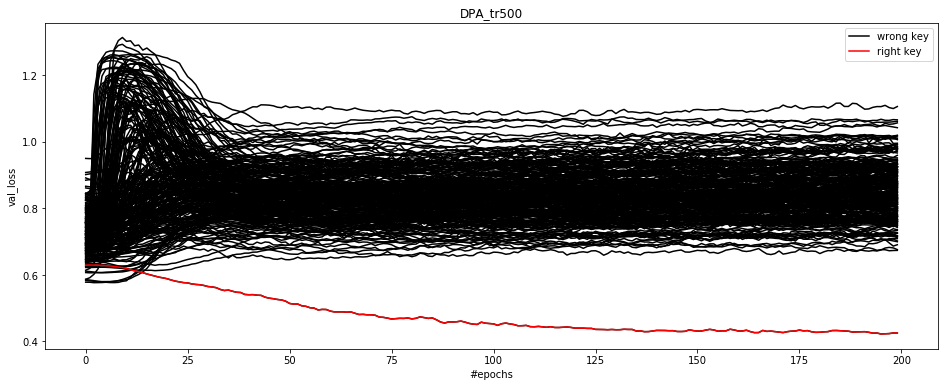

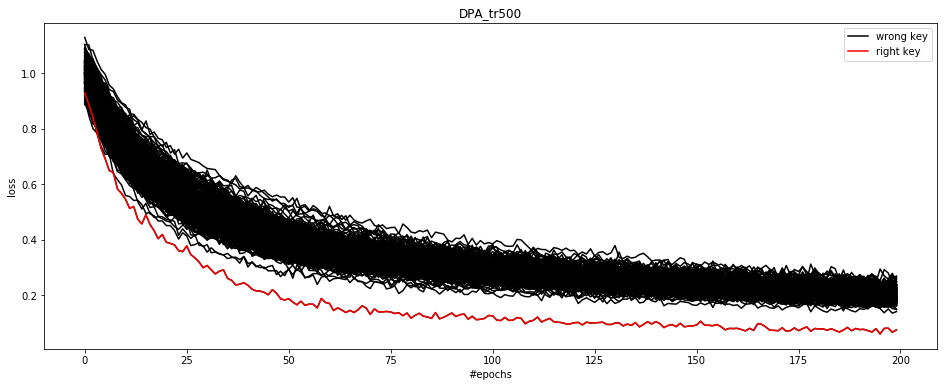

Training ended:  2020-06-22 12:51:24.424073
Elapsed :  1436.4363098144531
right key : 0x2b, val_loss : 0.4255680203437805, loss : 0.07559552362986974
right candidate : 0x2b
 val_loss : 0.4255680203437805
 ratio : 1.583590347725398 / 1.8725053286351159
 gap : 0.24835738897323612 / 0.06595749718802316




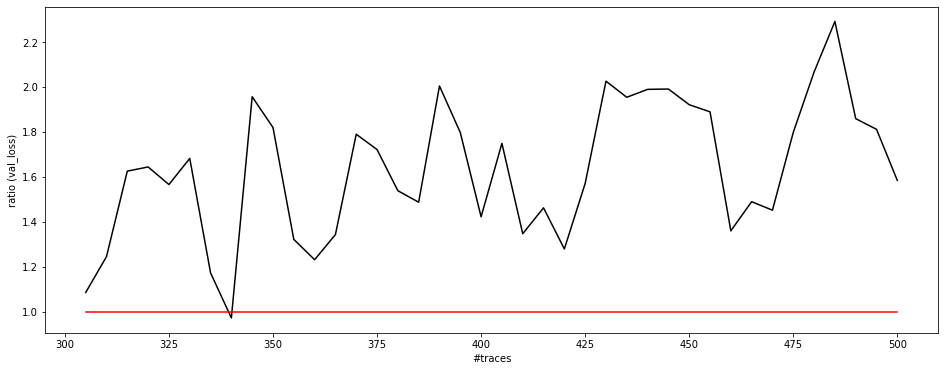

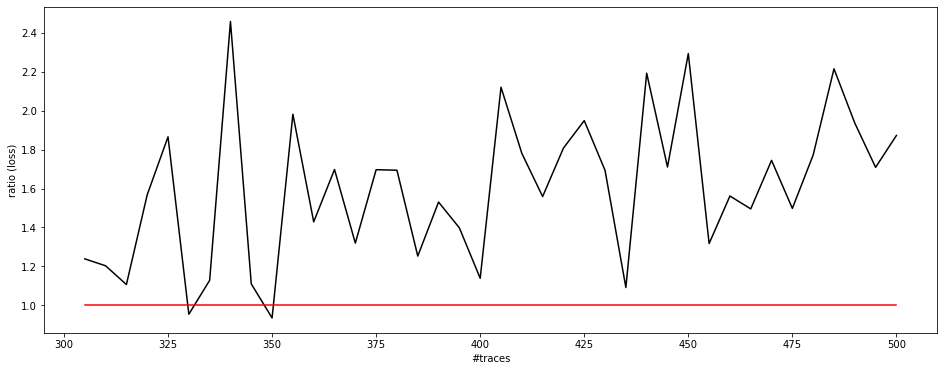

In [19]:
# target_byte 
for target_byte in range(0, 1):
    print('=================================================================================')
    print('target byte: {}'.format(target_byte + 1))

    rate = 0.7
    epochs = 200
    
    #########################################
    hidden_actfunc = ['softplus']
    hidden_nodes = [32]
    batch_layers = ['T']
    batch_layers2 = ['F']
    dropout_layers = [0]
    out_actfunc = 'sigmoid' # softmax / sigmoid

    # https://keras.io/initializers/
    kernel_initializer_list = ["lecun_uniform", "lecun_normal", "glorot_uniform", "glorot_normal", "he_uniform", "he_normal"]
    kernel_initializer = kernel_initializer_list[4]

    # https://keras.io/ko/optimizers/
    optimizer_list = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
    # keras.optimizers.SGD(lr=0.01, momentum=0.0, decay=0.0, nesterov=False)
    # keras.optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0)
    # keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
    # keras.optimizers.Adadelta(lr=1.0, rho=0.95, epsilon=None, decay=0.0)
    # keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
    # keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
    # keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)

    #optimizer = keras.optimizers.Adadelta(lr=1.0, rho=0.95, epsilon=None, decay=0.0)
    #optimizer = keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    #optimizer = keras.optimizers.Nadam()
    optimizer = keras.optimizers.Nadam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, schedule_decay=0.004)

    # https://keras.io/losses/ 
    loss_list = ['mean_squared_error', 
                 'mean_absolute_error', 
                 'mean_absolute_percentage_error', 
                 'mean_squared_logarithmic_error', 
                 'squared_hinge', 
                 'hinge', 
                 'categorical_hinge', 
                 'logcosh', 
                 'huber_loss', 
                 'categorical_crossentropy', 
                 'sparse_categorical_crossentropy', 
                 'binary_crossentropy', 
                 'kullback_leibler_divergence', 
                 'poisson', 
                 'cosine_proximity', 
                 'is_categorical_crossentropy']   

    loss = 'custom_corr' # custom_mse / custom_corr / custom_abscorr

    result_type = 'DPA' # HW, HW_Value, MSB, MSB_Value, LSB, LSB_Value, DPA, DPA_Value
    
    #########################################
    h_layers = '_'.join('h{}_{}'.format(*k) for k in enumerate(hidden_actfunc))
    h_nodes = '_'.join('h{}_{}'.format(*k) for k in enumerate(hidden_nodes))
    folder = 'D:/ML_based_SCA/SBY/Nonprofile_B%d_%s_%s_%s_%s_%s_%depochs_rate%.2f_trs2' % (target_byte + 1, h_layers, h_nodes, out_actfunc, loss, result_type, epochs, rate)
    #########################################
    
    try:
        os.stat(folder)
    except:
        os.mkdir(folder)
    
    # batch
    batch_sta = 32
    batch_end = 32
    batch_step = 5    
    f_batch = open('{}/{}_targetbyte_{}_epochs_{}.txt'.format(folder, result_type, target_byte + 1, epochs), 'w')
    f_batch.write('{}_targetbyte_{}_epochs_{}\n\n'.format(result_type, target_byte + 1, epochs))
    f_batch.write('batch_sta : {}, batch_end : {}, batch_step : {}\n\n'.format(batch_sta, batch_end, batch_step))
        
    for batch_size in range(batch_sta, batch_end + batch_step, batch_step):
        f = open('{}/{}_targetbyte_{}_epochs_{}_batch_{}.txt'.format(folder, result_type, target_byte + 1, epochs, batch_size), 'w')
        f.write('{}_targetbyte_{}_epochs_{}_batch_{}\n\n'.format(result_type, target_byte + 1, epochs, batch_size))

        # shuffling
        rand_idx = np.arange(0, num_traces)
        np.random.shuffle(rand_idx)
        
        X_attack = Trace_pre_normal[rand_idx]
        P_attack = pts[rand_idx]
        
        rk_int = keys[0][target_byte]
        rk = hex(rk_int)
        f.write('\n** right key (target byte) : {}\n'.format(rk))
        
        ############################
        if result_type == 'Value':
            num_classes = 256
        elif result_type == 'HW':
            num_classes = 9
        elif (result_type == 'HW_Value') or (result_type == 'MSB_Value') or (result_type == 'LSB_Value') or (result_type == 'DPA_Value'):
            num_classes = 1
        else:
            num_classes = 2
            
        m = build_MLP(X_attack.shape[1], hidden_actfunc, hidden_nodes, batch_layers, batch_layers2, dropout_layers, out_actfunc, kernel_initializer, optimizer, loss, num_classes, folder, result_type)
        Init = m.get_weights()
        ############################
        
        # trace
        trace_sta = 305
        trace_end = 500 #num_traces
        trace_step = 5
        tr_index_xtick = []
        ratio = []
        ratio2 = []
        ratio_sta = []
        for i in range(trace_sta, trace_end + trace_step, trace_step):
            print('** right key : {} / #trace : {} / target byte : {}'.format(rk, i, target_byte + 1))
            f.write('\n** right key : {} / #trace : {} / target byte : {}\n'.format(rk, i, target_byte + 1))
            tr_index_xtick.append(i)
            
            # shuffling
            rand_idx = np.arange(0, num_traces)
            np.random.shuffle(rand_idx)

            X_attack = Trace_pre_normal[rand_idx]
            P_attack = pts[rand_idx]
            
            print("Training started: ", datetime.datetime.now())
            start = time.time()
            
            ############################
            file_index = '%s_tr%d' % (result_type, i)
            right_candi, result, result2 = analysis_val_loss(m, Init, X_attack, P_attack, i, target_byte, 256, result_type, batch_size, epochs, rk_int, file_index, rate)    
            ############################
            
            elapsed = time.time() - start
            print("Training ended: ", datetime.datetime.now())
            print("Elapsed : ", elapsed)       
            
            test = result.copy()
            test2 = result2.copy()
            if rk_int == right_candi:
                right_key_val_loss = test[rk_int][epochs - 1]
                right_candi_val_loss = right_key_val_loss
                test[rk_int][epochs - 1] = 200
                t = np.min(test, axis = 0)
                ratio.append(t[epochs - 1] / right_key_val_loss)
                rat = t[epochs - 1] / right_key_val_loss
                gap = t[epochs - 1] - right_key_val_loss
                
                right_key_loss = test2[rk_int][epochs - 1]
                right_candi_loss = right_key_loss
                test2[rk_int][epochs - 1] = 200
                t2 = np.min(test2, axis = 0)
                ratio2.append(t2[epochs - 1] / right_key_loss)
                rat2 = t2[epochs - 1] / right_key_loss
                gap2 = t2[epochs - 1] - right_key_loss
            else:
                right_key_val_loss = test[rk_int][epochs - 1]
                right_candi_val_loss = test[right_candi][epochs - 1]
                ratio.append(right_candi_val_loss / right_key_val_loss)
                rat = right_candi_val_loss / right_key_val_loss
                gap = right_candi_val_loss - right_key_val_loss
                
                right_key_loss = test2[rk_int][epochs - 1]
                right_candi_loss = test2[right_candi][epochs - 1]
                ratio2.append(right_candi_loss / right_key_loss)
                rat2 = right_candi_loss / right_key_loss
                gap2 = right_candi_loss - right_key_loss
                
            ratio_sta.append(1)
            
            print('right key : {}, val_loss : {}, loss : {}'.format(rk, right_key_val_loss, right_key_loss))
            print('right candidate : {}\n val_loss : {}\n ratio : {} / {}\n gap : {} / {}\n\n'.format(hex(right_candi), right_candi_val_loss, rat, rat2, gap, gap2))
            f.write('right candidate : {}\n val_loss : {}\n ratio : {} / {}\n gap : {} / {}\n\n'.format(hex(right_candi), right_candi_val_loss, rat, rat2, gap, gap2))
            f.write('val_loss = {}\n'.format(result))
            f.write('loss = {}\n'.format(result2))
            if i == trace_end:
                f_batch.write('right candidate : {}\n val_loss : {}\n ratio : {} / {}\n gap : {} / {}\n\n'.format(hex(right_candi), right_candi_val_loss, rat, rat2, gap, gap2))
                f_batch.write('ratio (val_loss) : {}\n'.format(ratio))
                f_batch.write('ratio (loss) : {}\n'.format(ratio2))
                f_batch.write('tr_index_xtick : {}\n'.format(tr_index_xtick))
            
        f.close() 
        
        filename = '%s/Global_pre_MLP_nonprofile_ratio_%s.png' % (folder, file_index)
        fig = plt.figure(figsize = (16, 6))
        plt.plot(tr_index_xtick, ratio, color = 'black', label = 'ratio (val_loss)')
        plt.plot(tr_index_xtick, ratio_sta, color = 'red')
        plt.xlabel('#traces')
        plt.ylabel('ratio (val_loss)')
        plt.savefig(filename) 
        plt.show()
        
        filename = '%s/Global_pre_MLP_nonprofile_ratio2_%s.png' % (folder, file_index)
        fig = plt.figure(figsize = (16, 6))
        plt.plot(tr_index_xtick, ratio2, color = 'black', label = 'ratio (loss)')
        plt.plot(tr_index_xtick, ratio_sta, color = 'red')
        plt.xlabel('#traces')
        plt.ylabel('ratio (loss)')
        plt.savefig(filename) 
        plt.show()
              
        
    f_batch.close()